<center><image src="https://drive.google.com/uc?id=1n3G4TdK_u6PQHcLrxB_A0HijNdigXmUH">

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Домашнее задание можно разделить на следующие части:

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]
* Мир других лоссов! [2]
  * Dice Loss [1]
  * Focal Loss [1]
  * BONUS: лосс из статьи [5]
* Новая модель! [2]
  * UNet [2]


**Максимальный балл:** 10 баллов.

Также для студентов желающих еще более углубиться в задачу предлагается решить бонусное задание, которое даст дополнительные 5 баллов. BONUS задание необязательное.


# Загрузка данных

1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>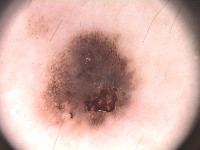</td><td>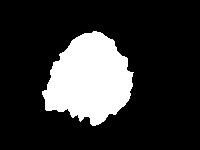</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [1]:
!gdown 1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

"gdown" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


In [2]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [1]:
images = []
lesions = []
from skimage.io import imread
from pathlib import Path
import os
base_dir = "PH2Dataset"

for dirpath, dirs, files in os.walk(base_dir): 
    if dirpath.endswith("_Dermoscopic_Image"):
        images.append(imread(Path(dirpath) / files[0]))
    if dirpath.endswith("_lesion"):
        lesions.append(imread(Path(dirpath) / files[0]))


Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.

In [2]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [3]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

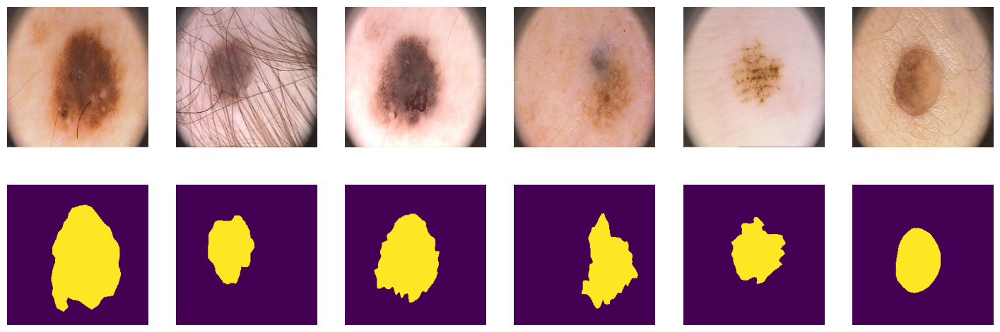

In [4]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [5]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [6]:
print(len(tr), len(val), len(ts))

100 50 50


## PyTorch DataLoader

In [7]:
from torch.utils.data import DataLoader
batch_size = 25
train_dataloader = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [8]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Метрика

## IoU (intersection over union)

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Что будет являться пересением и объединением в задаче сегментации?

Давайте разберем следующий пример:





<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1rBYFgli48AUUN9idiyq8j3J5DboB93yN" width=1000 height=800/></p>

In [9]:
!pip install torchmetrics

Defaulting to user installation because normal site-packages is not writeable


In [10]:
from torchmetrics import JaccardIndex

iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)

# Построй свой первый бейзлайн!

Итак, загрузка файлов, код датасета и даталоадера написана за вас. Метрика IoU написана за вас! Вам остается написать лосс, модель и функции обучения и теста модели.

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]

## BCE Loss [2 балла]

Популярным лоссом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

### Вывод численно стабильной формулы BCE лосса [1 балл]



Выведите из формулы [1] формулу [2]:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

Не забываем, что здесь $\hat y_i$ - это логиты сети, не вероятности и не лейблы.

**Ответ:**
$$
\begin{multline}
\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space
= \\ =
- \sum_i \left[y_i(\log1 - \log(1 + \exp(-\hat y_i))) + (1-y_i)(-\hat y_i - \log(1+\exp(-\hat y_i)))\right] \space = \\ =
-\sum_i \left[ y_i \log 1 + y_i \hat y_i - \hat y_i - \log(1+\exp(-\hat y_i)) \right] = \hat y - y \hat y + \log(1+\exp(-\hat y))
\end{multline}
$$

### Реализуйте в коде оба варианта лосса [1 балл]

Реализуйте следующие функции:

*   `bce_true()` - честная прямая реализация лосса с формулой $$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$
*   `bce_loss()` - реализация формулы, которую мы вывели $$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

И сравните результаты функций с реализацией Pytorch:
*   `bce_torch()`
*   `bce_torch_with_logits()`

In [11]:
import torch.nn.functional as F
import torch.nn as nn

In [12]:
bce_torch = nn.BCELoss(reduction='sum') # (sigmoid(y_pred), y_real)
bce_torch_with_logits = nn.BCEWithLogitsLoss(reduction='sum')

In [13]:
def bce_loss(y_pred, y_real):
  sigmoid = 1 / (1 + torch.exp(-y_pred))
  return -torch.sum(y_real * torch.log(sigmoid) + (1 - y_real) * torch.log(1 - sigmoid))

def bce_true(y_pred, y_real):
  return torch.sum(y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred)))

Проверим корректность работы на простом примере

In [14]:
y_pred = torch.randn(3, 2, requires_grad=False)
y_true = torch.rand(3, 2, requires_grad=False)
print(y_pred.shape)

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true)}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true)}')


torch.Size([3, 2])
BCE loss from scratch bce_loss = 6.162291049957275
BCE loss честно посчитанный = 6.162292003631592
BCE loss from torch bce_torch = 6.162291049957275
BCE loss from torch with logits bce_torch = 6.162292003631592


Инструкции `assert` в Python — это булевы выражения, которые проверяют, является ли условие истинным (`True`). Внизу в коде мы проверяем функция `bce_loss()` выдает тот же результат, что и функция из Pytorch или нет. Если равенства не будет, что будет означать, что результаты функций не совпадают, а значит вы неправильно реализовали фукнцию `bce_loss()`, `assert` возвратит ошибку.

Функция `numpy.isclose()` используется для сравнения двух чисел с учётом допустимой погрешности. Она особенно полезна при работе с числами с плавающей точкой, где точное сравнение может быть проблематичным из-за ограничений представления таких чисел в компьютере.

Как она работает?

`numpy.isclose(a, b, rtol=1e-05, atol=1e-08) `принимает два числа (`a` и `b`) и сравнивает их, учитывая относительную и абсолютную погрешность. Если разница между двумя числами меньше заданного порога, функция возвращает `True`, иначе — `False`.

Параметры:

    rtol: Относительная погрешность (по умолчанию 1e-05). Используется для определения разницы относительно большего значения.
    atol: Абсолютная погрешность (по умолчанию 1e-08). Определяет минимальную разницу, которую следует учитывать.

Мы будем использовать `assert` и `numpy.isclose()` для проверки корректности нашего кода.

In [15]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))

Давайте теперь посчитаем на простом примере, но с теми же размерностями, что и в датасете

In [16]:
y_pred = torch.randn((2, 1, 3, 3), requires_grad=False)
y_true = torch.randint(0, 2, (2, 1, 3, 3))

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float))}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true.to(torch.float))}')

BCE loss from scratch bce_loss = 16.817981719970703
BCE loss честно посчитанный = 16.817981719970703
BCE loss from torch bce_torch = 16.817981719970703
BCE loss from torch with logits bce_torch = 16.817981719970703


In [17]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))

Давайте посчитаем на реальных логитах и сегментационной маске:

In [18]:
!gdown --folder 1EX0RW1TRQVkLmR1h6miCQqyhYPFyg28M

"gdown" �� ���� ����७��� ��� ���譥�
��������, �ᯮ��塞�� �ணࠬ��� ��� ������ 䠩���.


In [19]:
path_to_dummy_samples = 'for_asserts'
dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
                 'labels': torch.load(f'{path_to_dummy_samples}/labels.pt')}
dummpy_sample['labels'] = dummpy_sample['labels'].to(device)
dummpy_sample['logits'] = dummpy_sample['logits'].to(device)

C:\Users\MSI\AppData\Local\Temp\ipykernel_48812\1347377685.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples

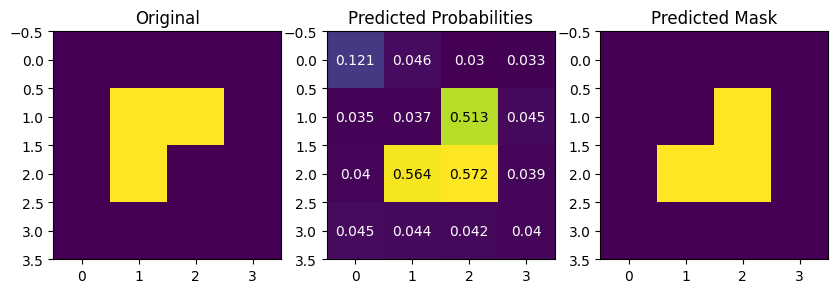

In [20]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (10,3*10))

ax1.imshow(dummpy_sample['labels'].squeeze(1)[0].cpu())
ax1.set_title("Original")

ax2.imshow(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu())
for (j,i),label in np.ndenumerate(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu()):
    if label < 0.5:
        color = 'white'
    else:
        color = 'black'
    ax2.text(i,j,round(label,3), color=color, ha='center',va='center')

ax2.set_title("Predicted Probabilities")

ax3.imshow((dummpy_sample['logits'].sigmoid() > 0.5).squeeze(1)[0].cpu())
ax3.set_title("Predicted Mask")
plt.show()

Проверяем на данном примере:

In [21]:
bce_loss_score = bce_loss(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_true_score = bce_true(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_torch_score = bce_torch(torch.sigmoid(dummpy_sample['logits'].cpu()), dummpy_sample['labels'].cpu().float())
bce_torch_with_logits_score = bce_torch_with_logits(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu().float())
assert np.isclose(bce_loss_score, bce_torch_score)
assert np.isclose(bce_loss_score, bce_torch_with_logits_score)
assert np.isclose(bce_true_score, bce_torch_score)
assert np.isclose(bce_true_score, bce_torch_with_logits_score)

## SegNet [2 балла]

Ваше задание здесь состоит в том, чтобы реализовать SegNet архитектуру.

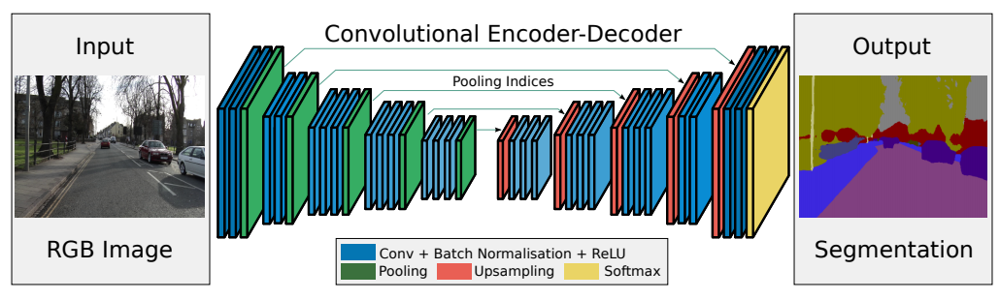

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Хорошие ресурсы по SegNet архитектуре:
1. https://medium.com/@nikdenof/segnet-from-scratch-using-pytorch-3fe9b4527239


In [23]:
from torchvision.models import vgg16
vgg = vgg16(pretrained=True)

C:\Users\MSI\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\MSI\AppData\Roaming\Python\Python310\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [24]:
class ConvReLU(nn.Module):
  def __init__(self, in_c=3, out_c=1, kernel_size=3, padding=1) -> None:
    super().__init__()
    self.cv = nn.Conv2d(in_c, out_c, kernel_size=kernel_size, padding=padding)
    self.bn = nn.BatchNorm2d(out_c)
    self.relu = nn.ReLU(inplace=True)

  def forward(self, x):
    x = self.cv(x)
    x = self.bn(x)
    x = self.relu(x)
    return x

class EncoderBlock(nn.Module):
  def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=1) -> None:
    super().__init__()
    self.layers = nn.ModuleList()
    for i in range(depth):
      conv_relu = ConvReLU(in_c if i == 0 else out_c, out_c, kernel_size, padding)
      self.layers.append(conv_relu)
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

  def forward(self, x):
    for layer in self.layers:
      x = layer(x)
    x, ind = self.pool(x)
    return x, ind

class DecoderBlock(nn.Module):
  def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=1, classification=False) -> None:
    super().__init__()
    self.unpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
    self.layers = nn.ModuleList()
    for i in range(depth):
      if i == depth - 1 and classification:
        conv = nn.Conv2d(in_c, out_c, kernel_size=kernel_size, padding=padding)
      elif i == depth - 1:
        conv = ConvReLU(in_c, out_c, kernel_size=kernel_size, padding=padding)
      else:
        conv = ConvReLU(in_c, in_c, kernel_size=kernel_size, padding=padding)
      self.layers.append(conv)

  def forward(self, x, ind):
    x = self.unpool(x, ind)
    for layer in self.layers:
      x = layer(x)
    return x


In [25]:
class SegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=64):
        super().__init__()

        # input shape: [25, 3, 256, 256]
        self.enc1 = EncoderBlock(in_channels, features, depth=2)
        self.enc2 = EncoderBlock(features, features*2, depth=2)
        self.enc3 = EncoderBlock(features*2, features*4, depth=3)

        # bottleneck
        self.bn_enc = EncoderBlock(features*4, features*4, depth=3)
        self.bn_dec = DecoderBlock(features*4, features*4, depth=3)

        # decoder
        self.dec1 = DecoderBlock(features*4, features*2, depth=3)
        self.dec2 = DecoderBlock(features*2, features)
        self.dec3 = DecoderBlock(features, out_channels, classification=True) # no relu


    def forward(self, x):
        # encoder
        e1, ind1 = self.enc1(x)
        e2, ind2 = self.enc2(e1)
        e3, ind3 = self.enc3(e2)

        # bottleneck
        b1, indb = self.bn_enc(e3)
        b2 = self.bn_dec(b1, indb)

        # decoder
        d1 = self.dec1(b2, ind3)
        d2 = self.dec2(d1, ind2)
        d3 = self.dec3(d2, ind1) # classification

        return d3

In [26]:
segnet_model = SegNet().to(device)

In [27]:
total_params = sum(p.numel() for p in segnet_model.parameters() if p.requires_grad)
total_params

7017217

## Тренировка [1 балл]

Напишите функцию для обучения модели.

In [28]:
from tqdm.notebook import tqdm

In [29]:
def _to_float_list(xs):
    out = []
    for x in xs:
        if hasattr(x, "detach"):
            x = x.detach()
        if hasattr(x, "cpu"):
            x = x.cpu()
        if hasattr(x, "item"):
            x = x.item()
        out.append(float(x))
    return out

In [30]:
def train(model, loaders, n_epochs, criterion, optimizer, scheduler, device, plot=False):
  hist_loss_tr = []
  hist_loss_val = []
  hist_iou_tr = []
  hist_iou_val = []
  for epoch in tqdm(range(n_epochs)):
    train_ious = []
    val_ious = []
    
    train_avg_loss = 0
    val_avg_loss = 0

    for k, dataloader in loaders.items():


      for X_batch, Y_batch in tqdm(dataloader):

        X_batch = X_batch.to(device)
        Y_batch = Y_batch.to(device).float()

        if (k == 'train'):

          model.train()
          optimizer.zero_grad()

          Y_pred = model(X_batch)
          loss = criterion(Y_pred, Y_batch)
          train_avg_loss += loss.item()

          loss.backward()

          optimizer.step()

          with torch.no_grad():
            probs = torch.sigmoid(Y_pred)
            preds = (probs > 0.5).float()
            iou = iou_score(preds, Y_batch)
          train_ious.append(iou)

        elif (k == 'val'):

          model.eval()

          with torch.no_grad():
            Y_pred = model(X_batch)
            
            loss = criterion(Y_pred, Y_batch)  # логиты идут в loss
            val_avg_loss += loss.item()
            
            probs = torch.sigmoid(Y_pred)     # sigmoid для IoU
            preds = (probs > 0.5).float()

            iou = iou_score(preds, Y_batch)
            val_ious.append(iou)

    train_avg_loss /= len(loaders['train'])
    val_avg_loss /= len(loaders['val'])

    mean_train_iou = sum(train_ious) / len(train_ious)
    mean_val_iou = sum(val_ious) / len(val_ious)
    print(f'Epoch: {epoch + 1} / {n_epochs}')
    print(f'train iou: {mean_train_iou}. val iou: {mean_val_iou}')
    print(f'train loss: {train_avg_loss}. val loss: {val_avg_loss}')
    
    hist_loss_tr.append(train_avg_loss)
    hist_loss_val.append(val_avg_loss)
    hist_iou_tr.append(mean_train_iou)
    hist_iou_val.append(mean_val_iou)

    scheduler.step(mean_val_iou)

    if plot and (epoch + 1) % 10 == 0 and epoch > 0:
      fig, axes = plt.subplots(3, 4, figsize=(9, 8))

      for i in range(4):
        orig_img = X_batch[i].permute(1,2,0).cpu().detach().numpy()
        orig_mask = Y_batch[i].squeeze().cpu().detach().numpy()

        with torch.no_grad():
          pred = model(X_batch[i].unsqueeze(0).to(device))
          pred_mask = torch.sigmoid(pred)
          pred_mask = (pred_mask > 0.5).float().squeeze().cpu().numpy()

        axes[0][i].imshow(orig_img)
        axes[0][i].set_title("orig")
        axes[1][i].imshow(orig_mask)
        axes[1][i].set_title("true")
        axes[2][i].imshow(pred_mask)
        axes[2][i].set_title("my pred(bred)")

      plt.show()

  # график метрики и лосса
  if plot:
    fig, axes = plt.subplots(2, 1, figsize=(9, 8))

    axes[0].plot(_to_float_list(hist_iou_tr), label='train iou', color='blue')
    axes[0].plot(_to_float_list(hist_iou_val), label='val iou', color='orange')
    axes[0].set_title('IoU')
    axes[0].legend()

    axes[1].plot(_to_float_list(hist_loss_tr), label='train loss', color='blue')
    axes[1].plot(_to_float_list(hist_loss_val), label='val loss', color='orange')
    axes[1].set_title('Loss')
    axes[1].legend()
    plt.show()

In [31]:
loaders = {
    'train': train_dataloader,
    'val': valid_dataloader
}

Обучите модель **SegNet**. В качестве оптимайзера можно взять Adam.

In [32]:
adamw = optim.AdamW(lr=3e-4, params=segnet_model.parameters())
bce_criterion = nn.BCEWithLogitsLoss()

In [33]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 30
train iou: 0.31412410736083984. val iou: 0.3657498061656952
train loss: 0.7088810503482819. val loss: 0.6948955655097961


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 30
train iou: 0.5233938097953796. val iou: 3.76082825823687e-05
train loss: 0.5810531079769135. val loss: 0.6888850927352905


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 30
train iou: 0.6983110308647156. val iou: 0.0
train loss: 0.4593726098537445. val loss: 0.6748264133930206


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 30
train iou: 0.6933227181434631. val iou: 0.0
train loss: 0.4154934957623482. val loss: 0.6605246663093567


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 30
train iou: 0.7364009022712708. val iou: 0.0
train loss: 0.3513324409723282. val loss: 0.6624704003334045


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 30
train iou: 0.7714371681213379. val iou: 0.0
train loss: 0.29329612106084824. val loss: 0.6867497265338898


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 30
train iou: 0.7674692273139954. val iou: 0.00637392420321703
train loss: 0.2913406118750572. val loss: 0.7119201123714447


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 30
train iou: 0.7517178654670715. val iou: 0.01563304103910923
train loss: 0.2803615853190422. val loss: 0.7406937181949615


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 30
train iou: 0.7944233417510986. val iou: 0.11956880986690521
train loss: 0.24142266809940338. val loss: 0.7059936821460724


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 30
train iou: 0.7851232290267944. val iou: 0.23104718327522278
train loss: 0.24314793199300766. val loss: 0.6292456388473511


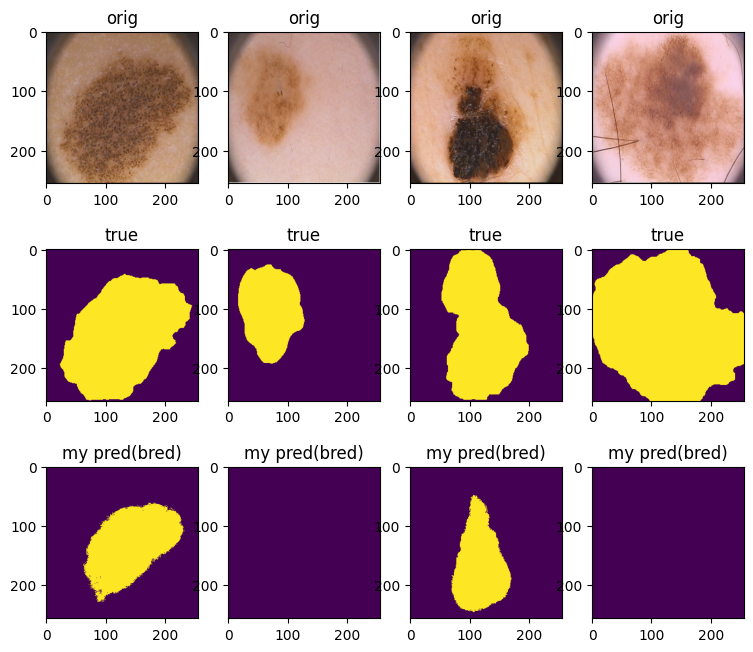

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 30
train iou: 0.7710661888122559. val iou: 0.34370729327201843
train loss: 0.2550516203045845. val loss: 0.5536083877086639


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 30
train iou: 0.8218425512313843. val iou: 0.40386444330215454
train loss: 0.20848433300852776. val loss: 0.5171878188848495


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 30
train iou: 0.8081932067871094. val iou: 0.5482985377311707
train loss: 0.21058224141597748. val loss: 0.42069339752197266


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 30
train iou: 0.8306552767753601. val iou: 0.6169835329055786
train loss: 0.19663280248641968. val loss: 0.3649002015590668


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 30
train iou: 0.8140004277229309. val iou: 0.6754921674728394
train loss: 0.20312556251883507. val loss: 0.33179377019405365


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 30
train iou: 0.821120023727417. val iou: 0.6861273050308228
train loss: 0.19441007822752. val loss: 0.3120826482772827


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 30
train iou: 0.8344917297363281. val iou: 0.6747356653213501
train loss: 0.18691973015666008. val loss: 0.3211800456047058


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 30
train iou: 0.8293812274932861. val iou: 0.7192649841308594
train loss: 0.1862771064043045. val loss: 0.285007581114769


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 30
train iou: 0.8349918723106384. val iou: 0.7202454805374146
train loss: 0.181602131575346. val loss: 0.27553535997867584


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 30
train iou: 0.8082226514816284. val iou: 0.7419141530990601
train loss: 0.2034814953804016. val loss: 0.25430765002965927


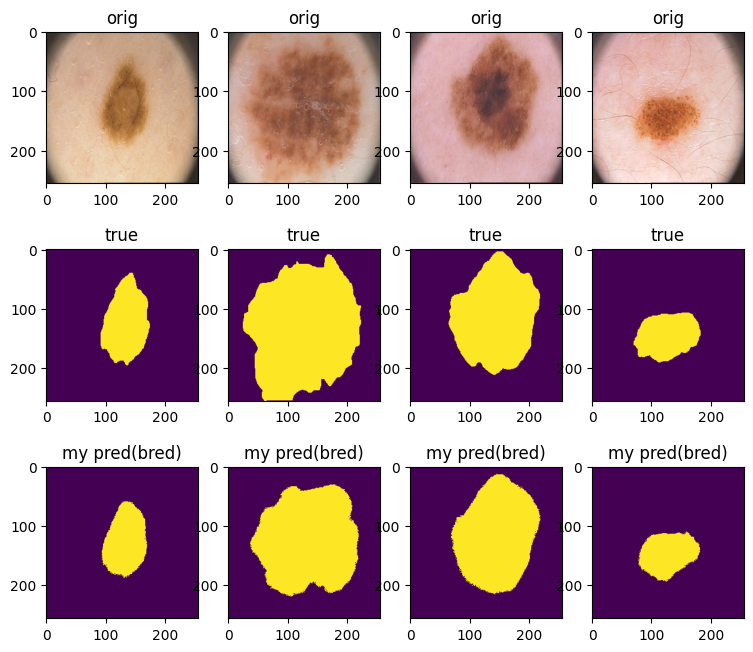

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 30
train iou: 0.8423604369163513. val iou: 0.7943999767303467
train loss: 0.17109328880906105. val loss: 0.21572957932949066


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 30
train iou: 0.8098205327987671. val iou: 0.8152478933334351
train loss: 0.19329418614506721. val loss: 0.20491962879896164


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 30
train iou: 0.8049373626708984. val iou: 0.7927916049957275
train loss: 0.19638478755950928. val loss: 0.21892184764146805


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 30
train iou: 0.8371891379356384. val iou: 0.8027742505073547
train loss: 0.1722840629518032. val loss: 0.20638667792081833


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 30
train iou: 0.8566384315490723. val iou: 0.8177312612533569
train loss: 0.15801064297556877. val loss: 0.19066768139600754


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 30
train iou: 0.860495924949646. val iou: 0.8192076683044434
train loss: 0.15256496891379356. val loss: 0.19795477390289307


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 30
train iou: 0.8547758460044861. val iou: 0.8172386288642883
train loss: 0.15051041170954704. val loss: 0.2046850621700287


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 30
train iou: 0.8662218451499939. val iou: 0.8120739459991455
train loss: 0.1417822428047657. val loss: 0.19830066710710526


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 30
train iou: 0.8305385708808899. val iou: 0.7897809743881226
train loss: 0.17537102475762367. val loss: 0.20964842289686203


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 30
train iou: 0.8587554097175598. val iou: 0.804961621761322
train loss: 0.14789070188999176. val loss: 0.20372380316257477


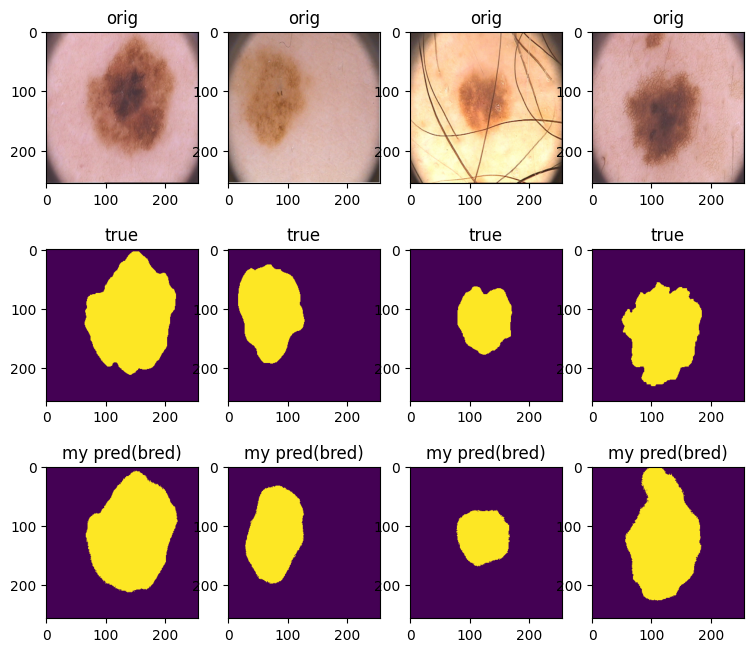

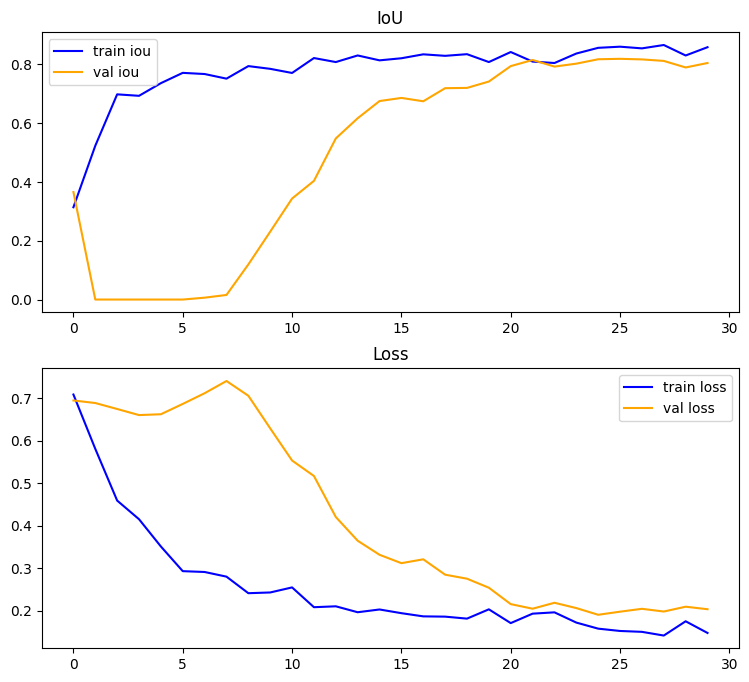

In [77]:
train(segnet_model, loaders, 30, bce_criterion, adamw, scheduler, device, plot=True)

## Инференс [1 балл]

После обучения модели напишите фукнцию теста, воспользуйтесь лучшим чекпоинтом и протестируйте работу модели на тестовой выборке.

In [34]:
def test(model, test_dataloader, device):
    model.eval()
    metric = JaccardIndex(task="binary", threshold=0.5).to(device)

    with torch.no_grad():
        for X_batch, Y_batch in test_dataloader:
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)

            if Y_batch.dim() == 4 and Y_batch.shape[1] == 1:
                Y_batch = Y_batch.squeeze(1)
            
            if Y_batch.dtype.is_floating_point:
                Yb = (Y_batch > 0.5).to(torch.int64)
            else:
                
                Yb = (Y_batch > 0).to(torch.int64)

            logits = model(X_batch)
            probs = torch.sigmoid(logits)
            if probs.dim() == 4 and probs.shape[1] == 1:
                probs = probs.squeeze(1)

            if probs.shape[-2:] != Yb.shape[-2:]:
                probs = F.interpolate(probs.unsqueeze(1), size=Yb.shape[-2:], mode='bilinear', align_corners=False).squeeze(1)

            metric.update(probs, Yb)

    return float(metric.compute())


In [35]:
test(segnet_model, test_dataloader, device)

0.0

metric with bce loss: `0.7292177081108093`

# Мир других лоссов!

## Дополнительные функции потерь [2 балла]

В данном разделе вам потребуется имплементировать две функции потерь: DICE и Focal loss.


### Dice Loss

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

В терминах матрицы ошибок она будет считаться следующим образом:

$$D(X,Y) = \frac{2TP}{2TP + FP + FN}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1- D(X, Y)$$

**Hints** (!):

1. Не забудьте подумать о численной нестабильности, возникающей в математической формуле при ситуации, когда $\frac{0}{0}$, т.е. вам нужно добавить очень маленькое число, например $\epsilon = 1e^{-8}$, в обе части дроби при подсчете $D(X,Y)$:

$$D(X,Y) = \frac{2TP + ϵ}{2TP + FP + FN + ϵ}$$

2. Dice метрика(!), не лосс, считается похожим образом как IoU:

    2.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    2.2. Фиксируем порог, например threshold=0.5, и всему что ниже порога ставим значение 0, всему что выше 1. Получаем предсказанную маску из 0 и 1.

    2.3. Считаем TP, FP, FN

    2.4. Считаем DICE метрику по формуле

Вы можете прописать для себя функцию `dice_score()` и сравнить с результатами работы функции из библиотеки `torchmetrics`.

3. Но с метрикой есть проблема, что она не дифференцируема, и если вы захотите просто взять и прописать `dice_loss` = 1 - `dice_score`, Pytorch поругается на вас и скажет, что это недифференцируемая метрика. Чтобы посчитать dice_loss делаем следующие шаги:

    3.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    3.2. Здесь нам уже не нужно фиксировать порог, мы просто работаем с вероятностями. Значения вероятностей дифференцируемы и через них будут протекать градиенты.

    3.3. Считаем TP, FP, FN также как и в Dice метрике, только вместо маски, подаем вероятности.

    3.4. Считаем DICE метрику по формуле

    3.5. Считаем лосс как Loss = 1 - DICE

Итак, давайте сначала пропишем dice_score.

In [36]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):
    '''
    Это именно метрика, не лосс.
    '''
    eps = 1e-8
    proba = logits.sigmoid()
    pred_mask = (proba > threshold).float()
    tp = torch.sum(labels * pred_mask)
    fn = torch.sum(labels * (1 - pred_mask))
    fp = torch.sum((1 - labels) * pred_mask)
    
    score = (2 * tp + eps) / (2 * tp + fn + fp + eps)
    return score

In [37]:
print(dice_score(dummpy_sample['logits'], dummpy_sample['labels']))

tensor(0.6667, device='cuda:0')


Проверим на корректность функцию dice_score:

In [38]:
pred = (dummpy_sample['logits'].sigmoid() > 0.5).int()
pred

tensor([[[[0, 0, 0, 0],
          [0, 0, 1, 0],
          [0, 1, 1, 0],
          [0, 0, 0, 0]]]], device='cuda:0', dtype=torch.int32)

In [39]:
from torchmetrics.segmentation import DiceScore

dice = DiceScore(num_classes=1, average='micro').to(device)
dice(pred, dummpy_sample['labels'].to(int))

C:\Users\MSI\AppData\Roaming\Python\Python310\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: DiceScore metric currently defaults to `average=micro`, but will change to`average=macro` in the v1.9 release. If you've explicitly set this parameter, you can ignore this warning.
  warnings.warn(*args, **kwargs)


tensor(0.6667, device='cuda:0')

In [40]:
assert dice(pred, dummpy_sample['labels'].to(int)) == dice_score(dummpy_sample['logits'], dummpy_sample['labels'].to(int))

Давайте теперь пропишем лосс и воспользуемся библиотекой `segmentation-models-pytorch`, чтобы убедиться в корректности нашей функции.

In [41]:
def dice_loss(
    logits: torch.Tensor,
    labels: torch.Tensor,
    reduction: str = 'mean',
    eps: float = 1e-8
    ):
    """
    Soft Dice loss (бинарная сегментация).
    logits: (N,1,H,W) или (N,H,W) — сырые выходы модели
    reduction: 'mean' или 'sum'
    labels: (N,1,H,W) или (N,H,W) — {0,1} (float/byte)
    """
    # приведение форм к (N,1,H,W)
    if logits.dim() == 3:
        logits = logits.unsqueeze(1)
    if labels.dim() == 3:
        labels = labels.unsqueeze(1)

    labels = labels.to(dtype=logits.dtype)
    
    proba = torch.sigmoid(logits)
    
    # суммируем по пространству, не выбирая (N,1)
    dims = tuple(range(2, proba.ndim))  # (H,W)
    intersection = (proba * labels).sum(dim=dims)
    cardinality = proba.sum(dim=dims) + labels.sum(dim=dims)
    
    dice = (2.0 * intersection + eps) / (cardinality + eps)  # (N,1)
    loss = 1.0 - dice # (N,1)

    if reduction == 'mean':
        return loss.mean()
    elif reduction == 'sum':
        return loss.sum()
    else:
        return loss

Проверка на корректность:

In [40]:
!pip install segmentation-models-pytorch

Defaulting to user installation because normal site-packages is not writeable


In [41]:
from segmentation_models_pytorch.losses import DiceLoss
dice_loss_torch = DiceLoss(mode='binary')
dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

In [42]:
assert dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'].to(int)) == dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])

### Focal Loss

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.


Из оригинальной статьи по [Focal Loss](https://arxiv.org/pdf/1708.02002.pdf):

$$p_t = \sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)$$

$$\mathcal L_{focal}(y, \hat y) = (1 - p_t)^{\gamma} \mathcal L_{BCE}(y_i, \hat y_i).$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - p_t)^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - (\sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)))^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

In [42]:
def focal_loss(
    y_pred: torch.Tensor,
    y_true: torch.Tensor,
    reduction: str = 'mean',
    eps: float = 1e-8,
    gamma: float = 2.0) -> torch.Tensor:
    
    # приведение форм к (N,1,H,W)
    if y_pred.dim() == 3:
        y_pred = y_pred.unsqueeze(1)
    if y_true.dim() == 3:
        y_true = y_true.unsqueeze(1)

    y_true = y_true.to(dtype=y_pred.dtype)
    
    probs = y_pred.sigmoid()
    
    p_true = probs * y_true + (1 - probs) * (1 - y_true)
    p_t = torch.clamp(p_true, min=eps, max=1 - eps)
    
    prod = torch.pow((1 - p_t), gamma)
    
    bce = torch.nn.functional.binary_cross_entropy_with_logits(y_pred, y_true, reduction='none')
    loss = prod * bce

    if reduction == 'mean':
        return loss.mean()
    elif reduction == 'sum':
        return loss.sum()
    else:
        return loss

Проверка корректности функции:

In [43]:
from torchvision.ops import sigmoid_focal_loss
sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum')

tensor(3.6161, device='cuda:0')

In [44]:
focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], reduction='sum', gamma=2.0)

tensor(3.6161, device='cuda:0')

In [45]:
assert sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum') == focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], reduction='sum', gamma=2.0)

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее, и провести численное сравнение с предыдущими функциями.

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

In [46]:
from scipy.ndimage import distance_transform_edt
import hashlib

def signed_distance_transform(mask : np.ndarray) -> np.ndarray:
    m = (mask > 0).astype(np.uint8)
    s = m.sum()
    if s == 0 or s == m.size:
        return np.zeros_like(m, dtype=np.float32)
    fg = distance_transform_edt(m) # расстояния до ближайшего пикселя фона
    bg = distance_transform_edt(1 - m) # расстояния до ближайшего пикселя объекта
    sdm = bg - fg # type: ignore
    return sdm.astype(np.float32) # вне объекта - положительные, внутри объекта - отрицательные

def phi_g_batch(y_real: torch.Tensor) -> torch.Tensor:
    """Возвращает phi_g для GT батча

    Args:
        y_real (torch.Tensor): (N, 1, H, W) или (N, H, W) тензор {0,1}

    Returns:
        torch.Tensor: phi_g той же формы (N, 1, H, W), torch.float32 на CPU
    """
    if y_real.dim() == 3:
        y_real = y_real.unsqueeze(1)  # (N, H, W) -> (N, 1, H, W)
    N, C, H, W = y_real.shape
    assert C == 1, "y_real должен быть (N, 1, H, W) или (N, H, W)"
    
    phi_list = []
    y_cpu = y_real.detach().cpu().float()
    for n in range(N):
        m = y_cpu[n, 0].numpy()  # mask - (H, W)
        phi = signed_distance_transform(m)
        phi_list.append(torch.from_numpy(phi).unsqueeze(0))  # (1, H, W)
    phi_g = torch.stack(phi_list, dim=0)  # (N, 1, H, W)
    return phi_g

def _mask_key(mask_u8: np.ndarray) -> str:
    # ключ: (H,W) + blake2b по байтам маски
    h = hashlib.blake2b(mask_u8.tobytes(), digest_size=16).hexdigest()
    return f"{mask_u8.shape[0]}x{mask_u8.shape[1]}:{h}"


def cached_phi_g_batch(y_real: torch.Tensor, cache: dict) -> torch.Tensor:
    if y_real.dim() == 3:
        y_real = y_real.unsqueeze(1)
    N, C, H, W = y_real.shape
    assert C == 1, "y_real должен быть (N, 1, H, W) или (N, H, W)"
        
    y_cpu = (y_real > 0.5).detach().cpu().to(torch.uint8)

    phi_list = []
    for i in range(N):
        m = y_cpu[i, 0].numpy()
        key = _mask_key(m)
        
        if key not in cache:
            sdf = signed_distance_transform(m).astype(np.float32)
            cache[key] = torch.from_numpy(sdf).unsqueeze(0)
        phi_list.append(cache[key])
    phi_batch = torch.stack(phi_list, dim=0)
    return phi_batch

In [47]:
def boundary_loss(y_pred: torch.Tensor,
                  y_real: torch.Tensor,
                  phi_g: torch.Tensor | None = None,
                  reduction: str = 'sum',
                  cache: dict | None = None) -> torch.Tensor:
    """Расчёт boundary loss

    Args:
        y_pred (torch.Tensor): сырые логиты модели (N, 1, H, W)
        y_real (torch.Tensor): маска gt (N, 1, H, W) или (N, H, W)
        phi_g (torch.Tensor, None): phi_g для y_real. Если None, то будет рассчитан (медленнее)
        reduction (str): 'sum' или 'mean' или 'none'
    Defaults to None.

    Returns:
        torch.Tensor: значение лосса
    """
    if y_pred.dim() == 3:
        y_pred = y_pred.unsqueeze(1)  # (N, H, W) -> (N, 1, H, W)
    if y_real.dim() == 3:
        y_real = y_real.unsqueeze(1)  # (N, H, W) -> (N, 1, H, W)
        
    if phi_g is None:
        phi_g = cached_phi_g_batch(y_real, cache) if not cache is None else phi_g_batch(y_real) # (N, 1, H, W)
        
    probs = torch.sigmoid(y_pred)
    phi_g = phi_g.to(device=probs.device, dtype=probs.dtype)
    phi_g = phi_g / (phi_g.abs().amax(dim=(2,3), keepdim=True) + 1e-6)
    
    pos = torch.relu(phi_g)
    neg = torch.relu(-phi_g)
    lb_map = pos * probs + neg * (1 - probs)
    # lb_map = phi_g * probs
    
    if reduction == 'sum':
        return lb_map.sum()
    elif reduction == 'mean':
        return lb_map.mean()
    else:
        return lb_map

In [48]:
def dice_boundary_loss(y_pred: torch.Tensor,
                       y_real: torch.Tensor,
                       phi_g: torch.Tensor | None = None,
                       alpha: float = 1.0,
                       reduction: str = 'mean',
                       cache: dict | None = None) -> torch.Tensor:
    """Комбинированный лосс dice + boundary loss"""
    dice = dice_loss(y_pred, y_real, reduction=reduction)
    boundary = boundary_loss(y_pred, y_real, phi_g, reduction, cache)
    return dice + alpha * boundary

In [49]:
phi_g = phi_g_batch(dummpy_sample['labels'])
dice_boundary_loss(dummpy_sample['logits'], dummpy_sample['labels'], phi_g, alpha=1.0)

tensor(0.6646, device='cuda:0')

## Обучите SegNet на новых лоссах

**Задание**: обучите SegNet на новых лоссах и сравните все три лосса:
*   При каком лоссе модель сходится быстрее?
*   При каком лоссе модель выдает наилучшую метрику?

Напишите развернутый ответ на вопросы.



  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 60
train iou: 0.4070148766040802. val iou: 0.0
train loss: 0.6047807484865189. val loss: 0.6192556619644165


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 60
train iou: 0.6917424201965332. val iou: 0.0
train loss: 0.4837361350655556. val loss: 0.6265802979469299


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 60
train iou: 0.6886271834373474. val iou: 0.0
train loss: 0.43082094192504883. val loss: 0.646105170249939


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 60
train iou: 0.6878958940505981. val iou: 0.0
train loss: 0.39093438535928726. val loss: 0.6864665746688843


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 60
train iou: 0.7022583484649658. val iou: 0.0
train loss: 0.36074963957071304. val loss: 0.7446402609348297


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 60
train iou: 0.7572417855262756. val iou: 0.0
train loss: 0.3255532830953598. val loss: 0.7799327671527863


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 60
train iou: 0.7582783699035645. val iou: 0.060222331434488297
train loss: 0.3136872872710228. val loss: 0.7736698687076569


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 60
train iou: 0.779698371887207. val iou: 0.1395891010761261
train loss: 0.29570841789245605. val loss: 0.7331050634384155


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 60
train iou: 0.7508630156517029. val iou: 0.36065787076950073
train loss: 0.2873323932290077. val loss: 0.5542769730091095


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 60
train iou: 0.7731015086174011. val iou: 0.5554244518280029
train loss: 0.2715116813778877. val loss: 0.3983740508556366


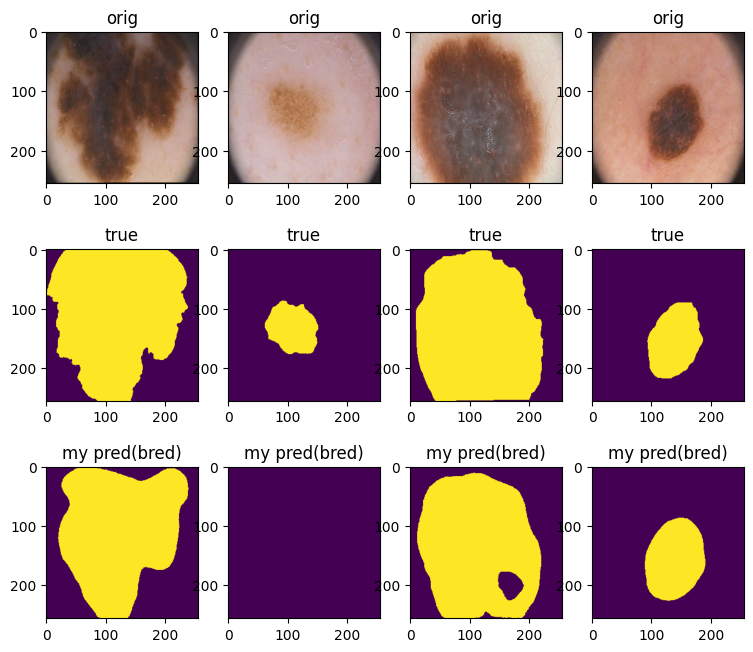

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 60
train iou: 0.7719841003417969. val iou: 0.7045273780822754
train loss: 0.2567117251455784. val loss: 0.2894800156354904


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 60
train iou: 0.8033800721168518. val iou: 0.7261900901794434
train loss: 0.24090788885951042. val loss: 0.27360352873802185


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 60
train iou: 0.8204940557479858. val iou: 0.7471091747283936
train loss: 0.2303633913397789. val loss: 0.2437550127506256


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 60
train iou: 0.7773475646972656. val iou: 0.7981650233268738
train loss: 0.22404290735721588. val loss: 0.20324703305959702


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 60
train iou: 0.8354014754295349. val iou: 0.7856816649436951
train loss: 0.2033858820796013. val loss: 0.21834155172109604


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 60
train iou: 0.8564257025718689. val iou: 0.8290774822235107
train loss: 0.19178292900323868. val loss: 0.18336228281259537


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 60
train iou: 0.7864161729812622. val iou: 0.8300686478614807
train loss: 0.2037012055516243. val loss: 0.1748111993074417


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 60
train iou: 0.8280385732650757. val iou: 0.8398178815841675
train loss: 0.17873100191354752. val loss: 0.16530966758728027


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 60
train iou: 0.8475671410560608. val iou: 0.8393581509590149
train loss: 0.16798722371459007. val loss: 0.16558106988668442


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 60
train iou: 0.8730787038803101. val iou: 0.8239220380783081
train loss: 0.15624569542706013. val loss: 0.1812635362148285


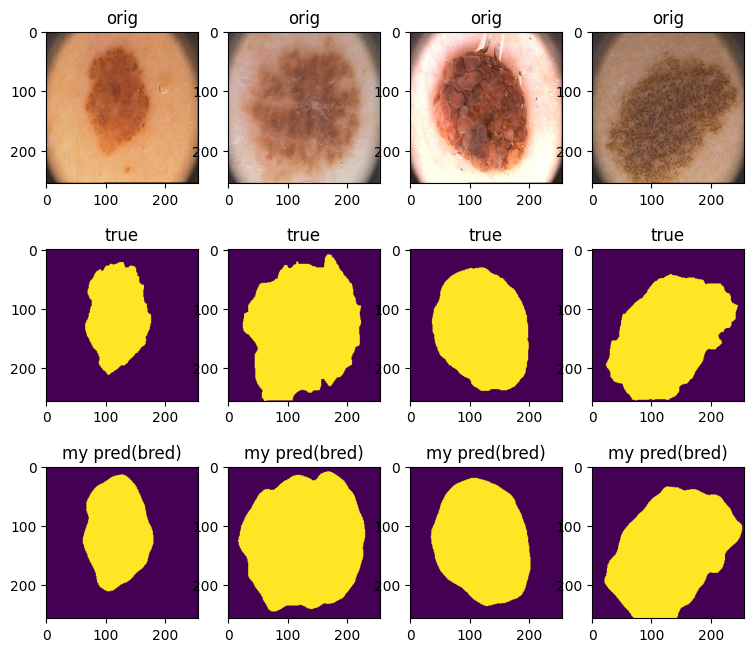

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 60
train iou: 0.8631517291069031. val iou: 0.8337526917457581
train loss: 0.16070278733968735. val loss: 0.16499242931604385


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 60
train iou: 0.8404331207275391. val iou: 0.827261745929718
train loss: 0.15294801630079746. val loss: 0.14932376891374588


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 60
train iou: 0.8470940589904785. val iou: 0.8403288125991821
train loss: 0.14256742410361767. val loss: 0.13818998634815216


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 60
train iou: 0.8262732625007629. val iou: 0.8423283100128174
train loss: 0.14933844096958637. val loss: 0.13511719554662704


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 60
train iou: 0.8481656312942505. val iou: 0.8370194435119629
train loss: 0.1422094590961933. val loss: 0.13734076172113419


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 60
train iou: 0.8501477837562561. val iou: 0.8331629037857056
train loss: 0.14053627848625183. val loss: 0.1358744278550148


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 60
train iou: 0.8563847541809082. val iou: 0.8518944978713989
train loss: 0.13514412194490433. val loss: 0.12380993738770485


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 60
train iou: 0.8773669600486755. val iou: 0.841649055480957
train loss: 0.1265253908932209. val loss: 0.13117195665836334


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 60
train iou: 0.8809044361114502. val iou: 0.8420811891555786
train loss: 0.12298651784658432. val loss: 0.13155869394540787


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 60
train iou: 0.8812044262886047. val iou: 0.8431921005249023
train loss: 0.11941620707511902. val loss: 0.1309143528342247


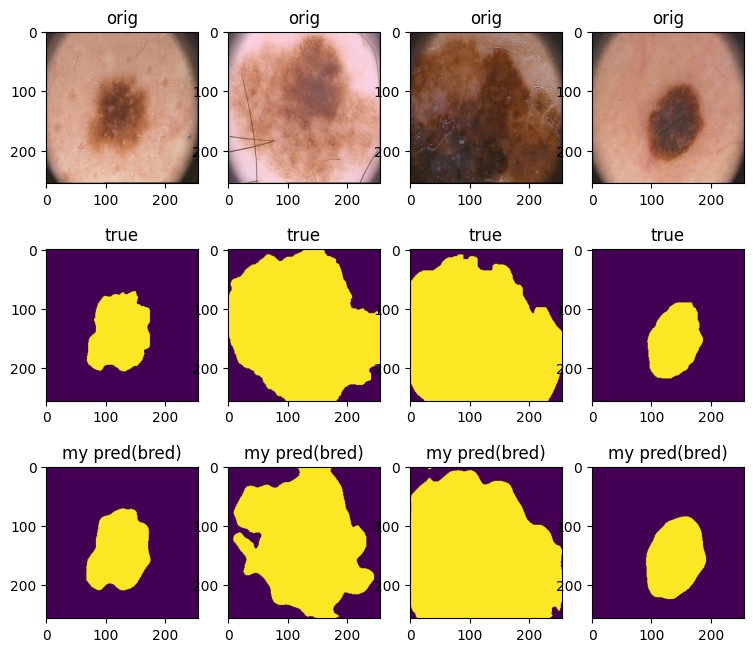

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 31 / 60
train iou: 0.8985207080841064. val iou: 0.859815776348114
train loss: 0.11325194872915745. val loss: 0.12124288827180862


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 32 / 60
train iou: 0.8926218748092651. val iou: 0.853814959526062
train loss: 0.10966719686985016. val loss: 0.12411374226212502


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 33 / 60
train iou: 0.8980149030685425. val iou: 0.8368654251098633
train loss: 0.10935425572097301. val loss: 0.12629226967692375


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 34 / 60
train iou: 0.9136411547660828. val iou: 0.8540308475494385
train loss: 0.09674679301679134. val loss: 0.11868246644735336


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 35 / 60
train iou: 0.8946734070777893. val iou: 0.8575201630592346
train loss: 0.1017286628484726. val loss: 0.11563674360513687


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 36 / 60
train iou: 0.9123759269714355. val iou: 0.8571984767913818
train loss: 0.09807428158819675. val loss: 0.11491304636001587


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 37 / 60
train iou: 0.9205838441848755. val iou: 0.8512356281280518
train loss: 0.09065679088234901. val loss: 0.11638914421200752


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 38 / 60
train iou: 0.9105325937271118. val iou: 0.8546948432922363
train loss: 0.09587859734892845. val loss: 0.11347725242376328


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 39 / 60
train iou: 0.9194828271865845. val iou: 0.8609050512313843
train loss: 0.08918707631528378. val loss: 0.10766799747943878


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 40 / 60
train iou: 0.9281688332557678. val iou: 0.8596258759498596
train loss: 0.08431453444063663. val loss: 0.11059869080781937


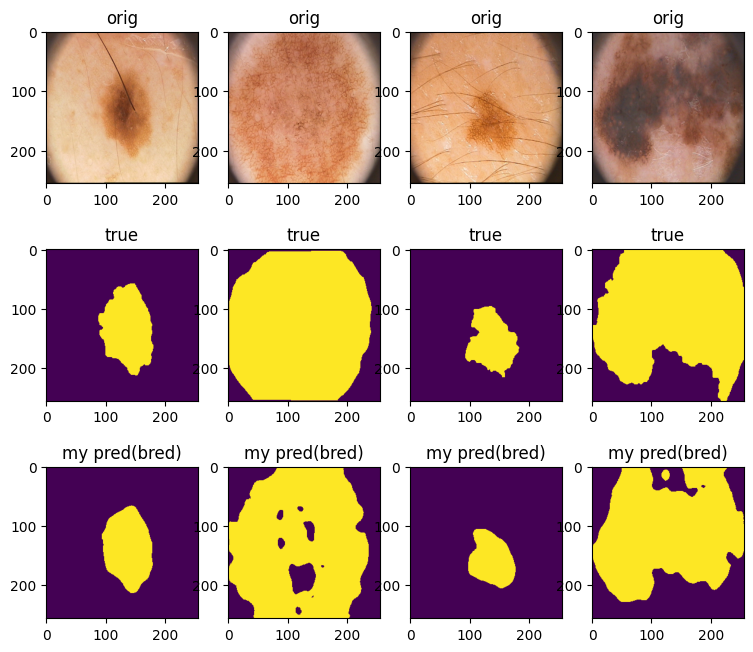

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 41 / 60
train iou: 0.9227455854415894. val iou: 0.8625549077987671
train loss: 0.08872929587960243. val loss: 0.11055970191955566


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 42 / 60
train iou: 0.9214823842048645. val iou: 0.8673895597457886
train loss: 0.0875740647315979. val loss: 0.10754388943314552


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 43 / 60
train iou: 0.9353674650192261. val iou: 0.871103048324585
train loss: 0.07983435690402985. val loss: 0.10382649675011635


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 44 / 60
train iou: 0.928703784942627. val iou: 0.8744980096817017
train loss: 0.08430294133722782. val loss: 0.10392915084958076


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 45 / 60
train iou: 0.8820551633834839. val iou: 0.8751419186592102
train loss: 0.09948474541306496. val loss: 0.10172896087169647


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 46 / 60
train iou: 0.9114988446235657. val iou: 0.877044677734375
train loss: 0.08584768418222666. val loss: 0.09898674488067627


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 47 / 60
train iou: 0.9301628470420837. val iou: 0.8736302852630615
train loss: 0.0781523222103715. val loss: 0.10074546560645103


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 48 / 60
train iou: 0.9351465702056885. val iou: 0.8620907664299011
train loss: 0.07932938635349274. val loss: 0.10701464116573334


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 49 / 60
train iou: 0.9188663363456726. val iou: 0.8523361086845398
train loss: 0.08308052830398083. val loss: 0.11082031950354576


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 50 / 60
train iou: 0.9202204942703247. val iou: 0.8506429195404053
train loss: 0.08095700107514858. val loss: 0.10976444184780121


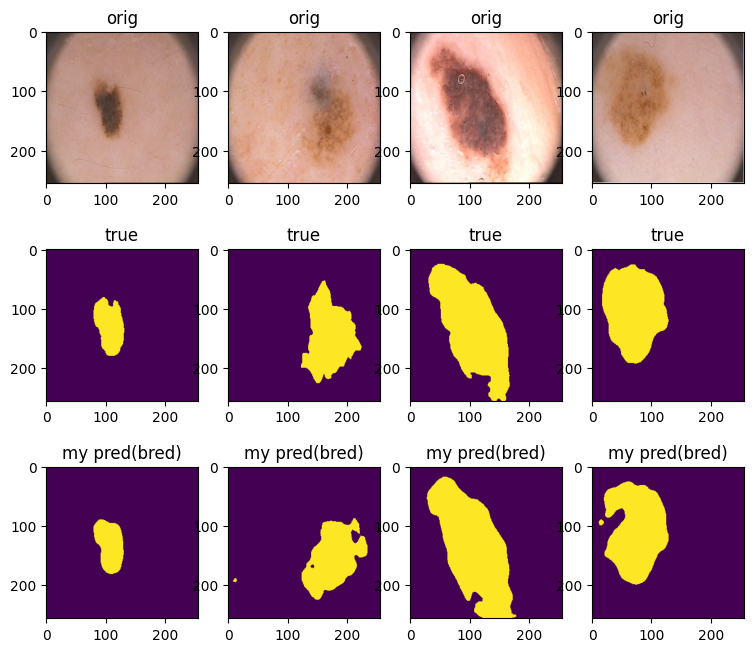

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 51 / 60
train iou: 0.9356288313865662. val iou: 0.850548505783081
train loss: 0.07534252479672432. val loss: 0.10844368860125542


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 52 / 60
train iou: 0.9348482489585876. val iou: 0.8521956205368042
train loss: 0.0739061813801527. val loss: 0.1070437803864479


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 53 / 60
train iou: 0.9233548641204834. val iou: 0.8556168675422668
train loss: 0.08328681346029043. val loss: 0.10548117011785507


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 54 / 60
train iou: 0.9375746846199036. val iou: 0.8596081733703613
train loss: 0.07135478127747774. val loss: 0.10361798480153084


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 55 / 60
train iou: 0.9313571453094482. val iou: 0.8616374731063843
train loss: 0.0801960676908493. val loss: 0.10235195234417915


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 56 / 60
train iou: 0.9354515671730042. val iou: 0.8615822196006775
train loss: 0.07332494203001261. val loss: 0.10234309732913971


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 57 / 60
train iou: 0.93571937084198. val iou: 0.8611240386962891
train loss: 0.07564381789416075. val loss: 0.10275543481111526


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 58 / 60
train iou: 0.9420919418334961. val iou: 0.8622335195541382
train loss: 0.07109931204468012. val loss: 0.10192997008562088


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 59 / 60
train iou: 0.9395150542259216. val iou: 0.8634690642356873
train loss: 0.06904875487089157. val loss: 0.10180016979575157


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 60 / 60
train iou: 0.9459251165390015. val iou: 0.8656079769134521
train loss: 0.06718268245458603. val loss: 0.10103189200162888


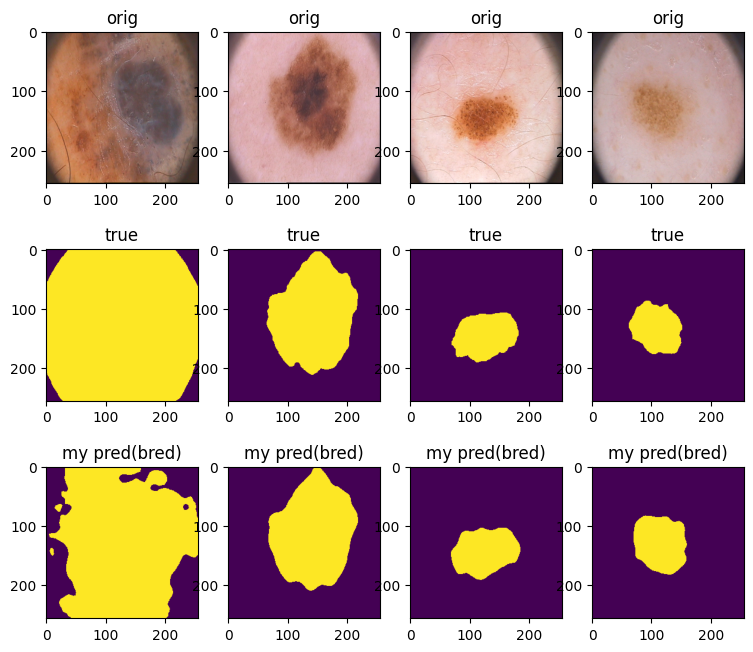

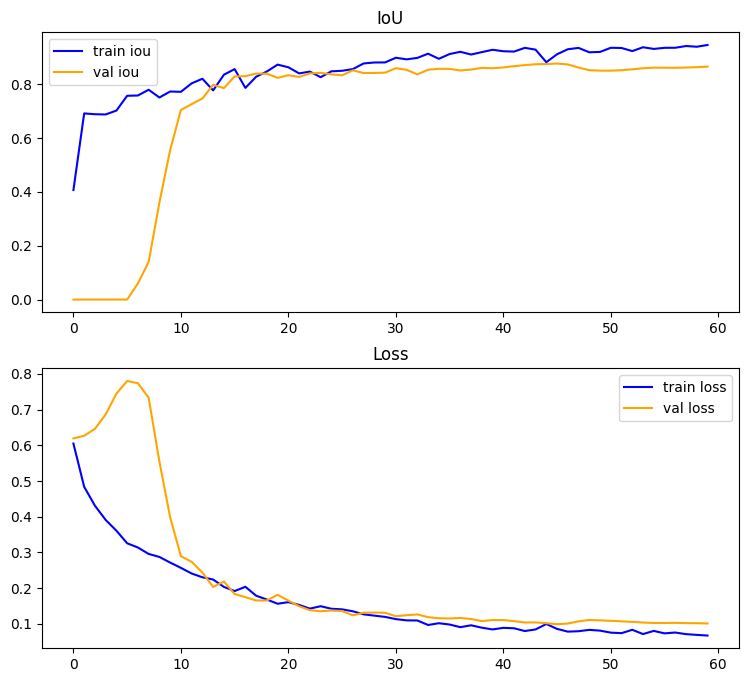

In [79]:
segnet_model_dice = SegNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=segnet_model_dice.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)
criterion_dice = lambda y_pred, y_real: dice_loss(y_pred, y_real)

train(segnet_model_dice, loaders, 60, criterion_dice, adamw, scheduler, device, plot=True)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 50
train iou: 0.2757623493671417. val iou: 0.24329426884651184
train loss: 0.2043401263654232. val loss: 0.17332648485898972


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 50
train iou: 0.21268685162067413. val iou: 0.016652431339025497
train loss: 0.17962999269366264. val loss: 0.17261122167110443


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 50
train iou: 0.1064067929983139. val iou: 0.0002021284744841978
train loss: 0.17242789641022682. val loss: 0.17166177928447723


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 50
train iou: 0.02410045638680458. val iou: 8.848482139001135e-06
train loss: 0.16135036572813988. val loss: 0.16972146928310394


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 50
train iou: 0.011148784309625626. val iou: 5.405662705015857e-06
train loss: 0.15217958018183708. val loss: 0.16698776930570602


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 50
train iou: 0.019295411184430122. val iou: 0.0005327893886715174
train loss: 0.14622467383742332. val loss: 0.16356296092271805


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 50
train iou: 0.053840406239032745. val iou: 0.01765868440270424
train loss: 0.13918311893939972. val loss: 0.1585787534713745


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 50
train iou: 0.18500514328479767. val iou: 0.1904677450656891
train loss: 0.12959929555654526. val loss: 0.1524338647723198


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 50
train iou: 0.4635547995567322. val iou: 0.5254209041595459
train loss: 0.11078773438930511. val loss: 0.14203370362520218


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 50
train iou: 0.645777702331543. val iou: 0.5916500091552734
train loss: 0.09781749546527863. val loss: 0.1214064285159111


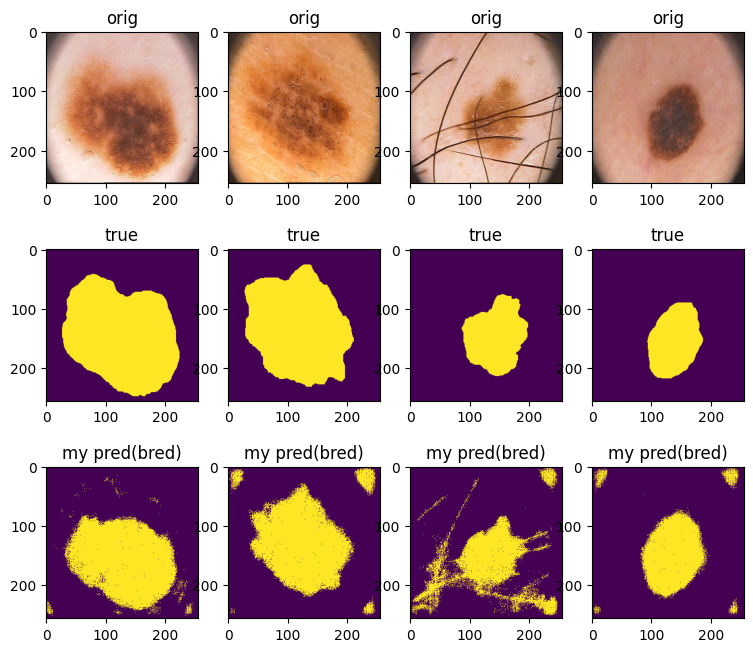

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 50
train iou: 0.7294093370437622. val iou: 0.6491263508796692
train loss: 0.08003953471779823. val loss: 0.11358223855495453


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 50
train iou: 0.765147864818573. val iou: 0.6808582544326782
train loss: 0.06603483483195305. val loss: 0.09023414552211761


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 50
train iou: 0.7705603837966919. val iou: 0.71353679895401
train loss: 0.06036829948425293. val loss: 0.08034754544496536


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 50
train iou: 0.7524139881134033. val iou: 0.7085585594177246
train loss: 0.06377055868506432. val loss: 0.07895198836922646


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 50
train iou: 0.7938562631607056. val iou: 0.7540982365608215
train loss: 0.05227017682045698. val loss: 0.06923089735209942


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 50
train iou: 0.7946798205375671. val iou: 0.6596711874008179
train loss: 0.050847338512539864. val loss: 0.09421185776591301


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 50
train iou: 0.8077652454376221. val iou: 0.7360227108001709
train loss: 0.04712024424225092. val loss: 0.07009882666170597


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 50
train iou: 0.8377374410629272. val iou: 0.7557961940765381
train loss: 0.04002364445477724. val loss: 0.06953807920217514


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 50
train iou: 0.8458433151245117. val iou: 0.7070947885513306
train loss: 0.03821446839720011. val loss: 0.0799165777862072


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 50
train iou: 0.8011748790740967. val iou: 0.7227652072906494
train loss: 0.04640227369964123. val loss: 0.0702543817460537


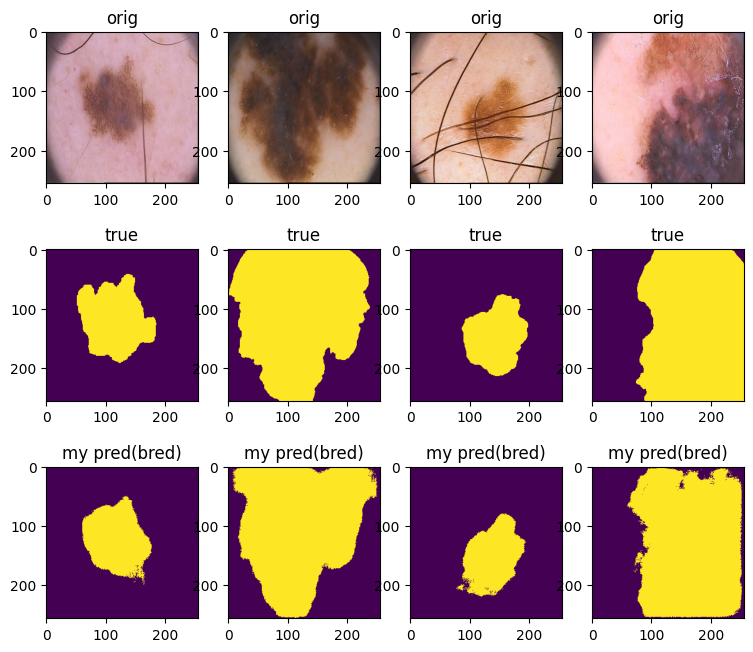

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 50
train iou: 0.811991810798645. val iou: 0.8056416511535645
train loss: 0.041204798966646194. val loss: 0.05063541233539581


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 50
train iou: 0.8240671753883362. val iou: 0.7807507514953613
train loss: 0.040759025141596794. val loss: 0.06767779216170311


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 50
train iou: 0.8104715943336487. val iou: 0.7589781284332275
train loss: 0.045840258710086346. val loss: 0.06241166591644287


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 50
train iou: 0.8096551299095154. val iou: 0.7381347417831421
train loss: 0.042299093678593636. val loss: 0.06406444311141968


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 50
train iou: 0.80295330286026. val iou: 0.7978867292404175
train loss: 0.042898235842585564. val loss: 0.050710223615169525


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 50
train iou: 0.8500918745994568. val iou: 0.8137025833129883
train loss: 0.03380560455843806. val loss: 0.04811326414346695


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 50
train iou: 0.856721043586731. val iou: 0.8139758110046387
train loss: 0.03220392717048526. val loss: 0.04787740483880043


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 50
train iou: 0.8490508198738098. val iou: 0.8039331436157227
train loss: 0.03302916185930371. val loss: 0.050781700760126114


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 50
train iou: 0.8574352860450745. val iou: 0.8048126697540283
train loss: 0.03258668631315231. val loss: 0.04699105769395828


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 50
train iou: 0.8372558951377869. val iou: 0.7871336936950684
train loss: 0.03675773972645402. val loss: 0.05252322368323803


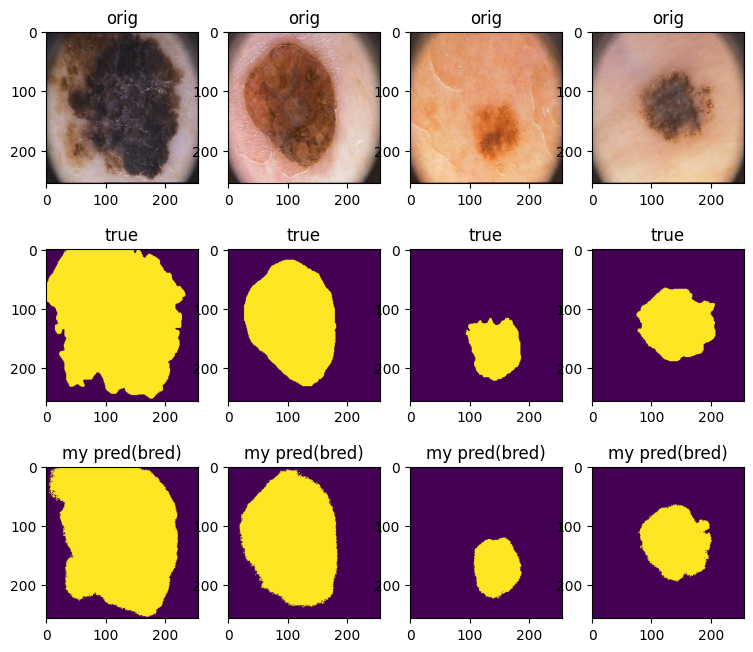

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 31 / 50
train iou: 0.8470458984375. val iou: 0.8191041946411133
train loss: 0.03400100441649556. val loss: 0.045331044122576714


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 32 / 50
train iou: 0.8775168657302856. val iou: 0.7971808910369873
train loss: 0.028329804074019194. val loss: 0.05273130722343922


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 33 / 50
train iou: 0.8625800609588623. val iou: 0.8305455446243286
train loss: 0.03189746243879199. val loss: 0.045262519270181656


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 34 / 50
train iou: 0.823691189289093. val iou: 0.8243838548660278
train loss: 0.0393232936039567. val loss: 0.0445143673568964


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 35 / 50
train iou: 0.8637672066688538. val iou: 0.7718362808227539
train loss: 0.030536385718733072. val loss: 0.0584445558488369


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 36 / 50
train iou: 0.8305355310440063. val iou: 0.7812383770942688
train loss: 0.037119023967534304. val loss: 0.05308056063950062


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 37 / 50
train iou: 0.8615932464599609. val iou: 0.8303924798965454
train loss: 0.03113523405045271. val loss: 0.04200637713074684


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 38 / 50
train iou: 0.8395605683326721. val iou: 0.827652096748352
train loss: 0.034529282711446285. val loss: 0.042601507157087326


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 39 / 50
train iou: 0.8829097747802734. val iou: 0.8083233833312988
train loss: 0.02618226408958435. val loss: 0.049646079540252686


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 40 / 50
train iou: 0.8823660612106323. val iou: 0.8266557455062866
train loss: 0.026767128612846136. val loss: 0.04543041344732046


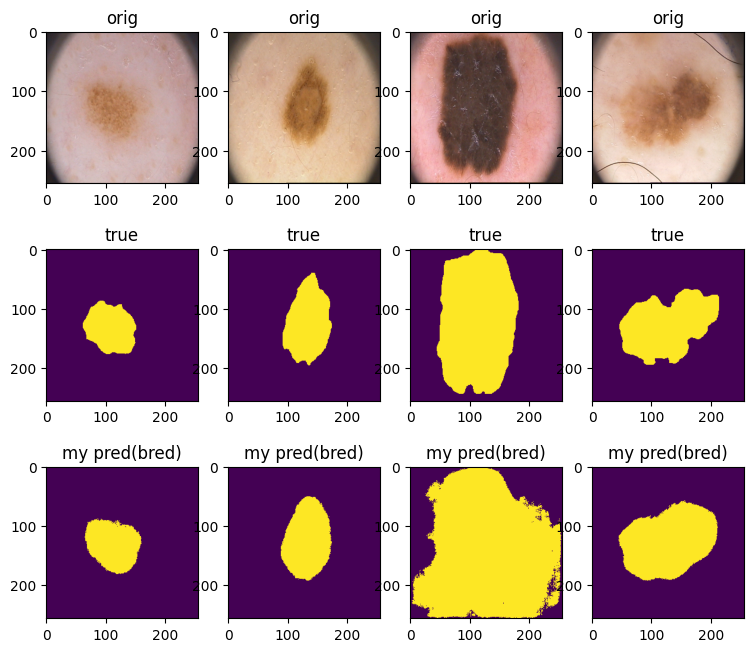

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 41 / 50
train iou: 0.85447096824646. val iou: 0.831993818283081
train loss: 0.031485116109251976. val loss: 0.04157190956175327


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 42 / 50
train iou: 0.885879397392273. val iou: 0.8281421661376953
train loss: 0.02516864985227585. val loss: 0.04201443865895271


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 43 / 50
train iou: 0.8785398006439209. val iou: 0.8218643665313721
train loss: 0.026898395735770464. val loss: 0.04390929080545902


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 44 / 50
train iou: 0.8994981050491333. val iou: 0.8183444738388062
train loss: 0.02266087057068944. val loss: 0.04525385983288288


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 45 / 50
train iou: 0.891947865486145. val iou: 0.8193550109863281
train loss: 0.024724965915083885. val loss: 0.04636561684310436


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 46 / 50
train iou: 0.8787440061569214. val iou: 0.8266942501068115
train loss: 0.02668838854879141. val loss: 0.04398596100509167


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 47 / 50
train iou: 0.8846532702445984. val iou: 0.8355841040611267
train loss: 0.025699954945594072. val loss: 0.041223859414458275


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 48 / 50
train iou: 0.900227427482605. val iou: 0.8342483043670654
train loss: 0.02238477347418666. val loss: 0.04186982661485672


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 49 / 50
train iou: 0.8990015983581543. val iou: 0.8248590230941772
train loss: 0.022248724475502968. val loss: 0.04491216503083706


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 50 / 50
train iou: 0.9034236669540405. val iou: 0.8232220411300659
train loss: 0.022231603041291237. val loss: 0.04677046835422516


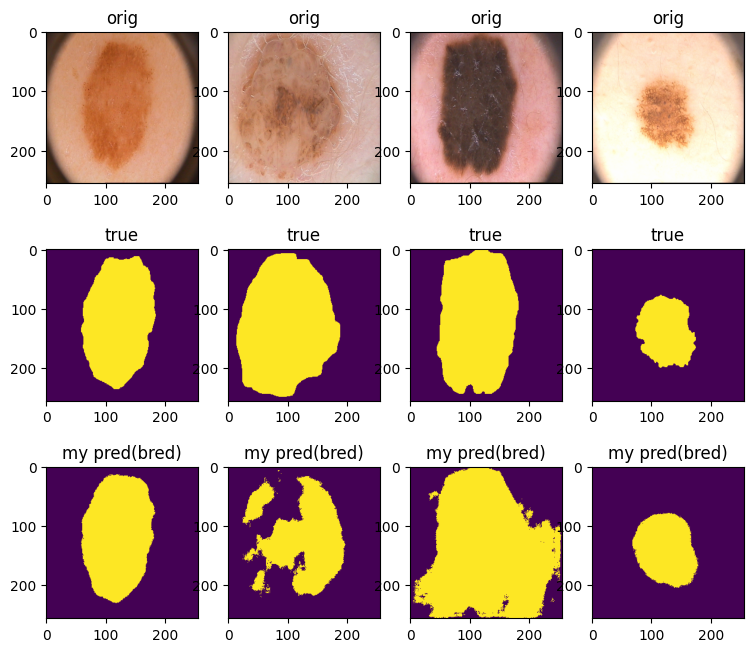

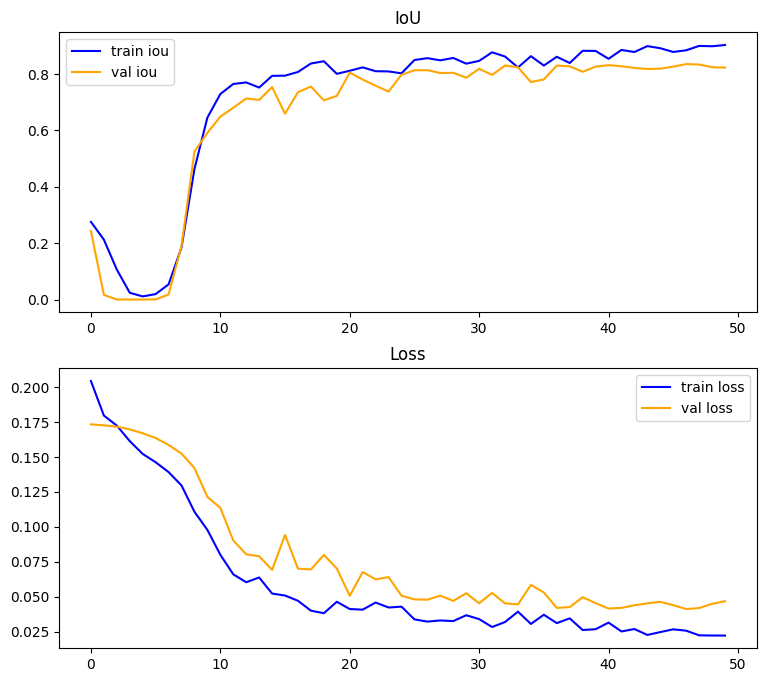

In [80]:
segnet_model_focal = SegNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=segnet_model_focal.parameters())
criterion = lambda y_pred, y_real: focal_loss(y_pred, y_real, gamma=2.0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

train(segnet_model_focal, loaders, 50, criterion, adamw, scheduler, device, plot=True)

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 70
train iou: 0.1743803322315216. val iou: 0.0
train loss: 0.8257526457309723. val loss: 0.7758801281452179


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 70
train iou: 0.33562391996383667. val iou: 0.08178669214248657
train loss: 0.797091156244278. val loss: 0.7755145132541656


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 70
train iou: 0.5056429505348206. val iou: 0.34044671058654785
train loss: 0.7027874439954758. val loss: 0.7732110023498535


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 70
train iou: 0.6840253472328186. val iou: 0.14823713898658752
train loss: 0.5952557623386383. val loss: 0.7711519300937653


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 70
train iou: 0.7130701541900635. val iou: 0.16176798939704895
train loss: 0.49997247010469437. val loss: 0.765846848487854


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 70
train iou: 0.717125654220581. val iou: 0.30871453881263733
train loss: 0.4438839703798294. val loss: 0.6860563158988953


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 70
train iou: 0.7568861246109009. val iou: 0.34646689891815186
train loss: 0.3881131187081337. val loss: 0.6602395176887512


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 70
train iou: 0.7415988445281982. val iou: 0.43883419036865234
train loss: 0.34716684371232986. val loss: 0.5681950151920319


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 70
train iou: 0.784210205078125. val iou: 0.5933212041854858
train loss: 0.3019922822713852. val loss: 0.4143795371055603


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 70
train iou: 0.7850410342216492. val iou: 0.7211906909942627
train loss: 0.2717379555106163. val loss: 0.2850309759378433


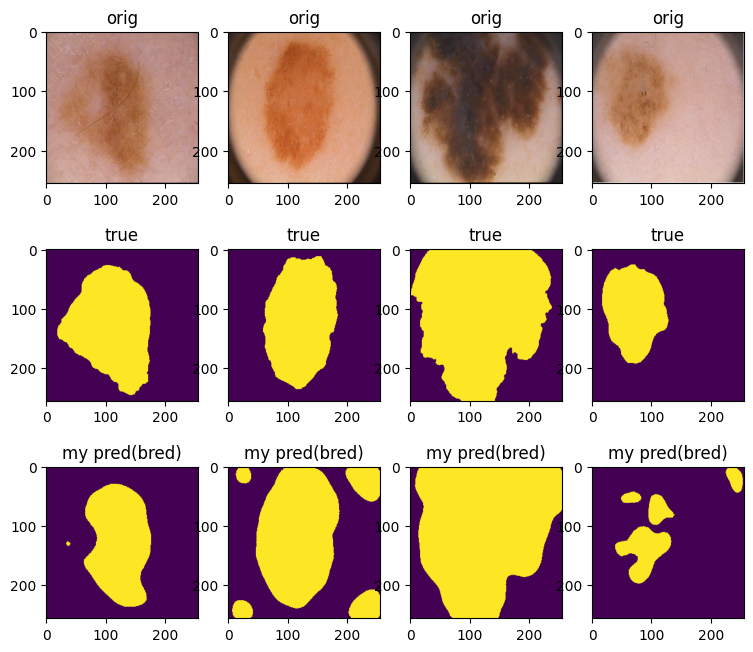

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 70
train iou: 0.7851610779762268. val iou: 0.6823076605796814
train loss: 0.24985170736908913. val loss: 0.32061198353767395


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 70
train iou: 0.816238284111023. val iou: 0.7374722957611084
train loss: 0.2211485095322132. val loss: 0.24668484181165695


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 70
train iou: 0.7639824748039246. val iou: 0.7791494131088257
train loss: 0.21697858348488808. val loss: 0.21285133063793182


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 70
train iou: 0.8266708850860596. val iou: 0.7757791876792908
train loss: 0.18162816390395164. val loss: 0.22061976790428162


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 70
train iou: 0.8253024220466614. val iou: 0.7844679355621338
train loss: 0.16951169818639755. val loss: 0.20927221328020096


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 70
train iou: 0.8411445021629333. val iou: 0.8060246706008911
train loss: 0.15913692116737366. val loss: 0.18711423873901367


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 70
train iou: 0.8143587708473206. val iou: 0.7883467674255371
train loss: 0.1593777872622013. val loss: 0.18577051162719727


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 70
train iou: 0.8225736021995544. val iou: 0.7530146241188049
train loss: 0.15498652309179306. val loss: 0.19955159723758698


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 70
train iou: 0.8396634459495544. val iou: 0.7882939577102661
train loss: 0.14406727068126202. val loss: 0.1710863709449768


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 70
train iou: 0.8221235275268555. val iou: 0.7937192320823669
train loss: 0.13953227177262306. val loss: 0.16714627295732498


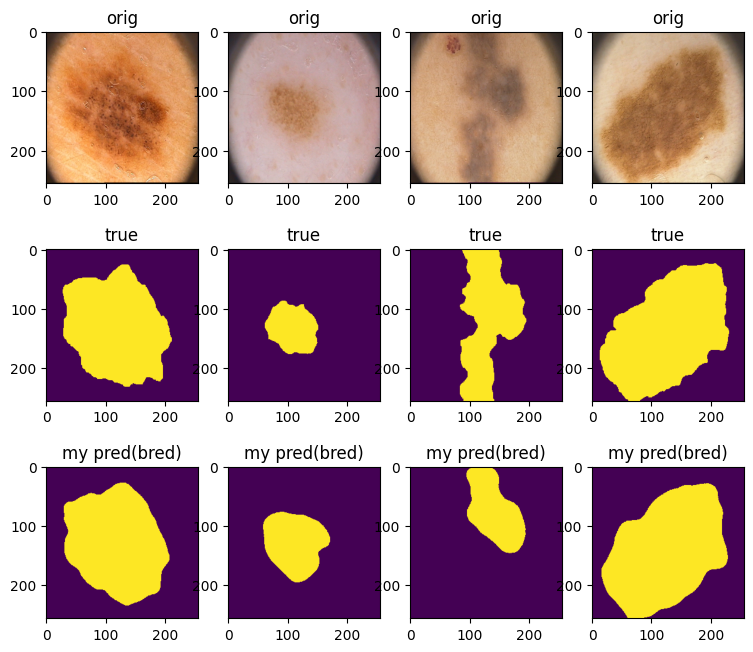

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 70
train iou: 0.8463285565376282. val iou: 0.8211862444877625
train loss: 0.12279631197452545. val loss: 0.13677022233605385


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 70
train iou: 0.8577375411987305. val iou: 0.8404078483581543
train loss: 0.12014816142618656. val loss: 0.12629995122551918


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 70
train iou: 0.8637545704841614. val iou: 0.8315351009368896
train loss: 0.11437822133302689. val loss: 0.12900759279727936


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 70
train iou: 0.8230451345443726. val iou: 0.8219524621963501
train loss: 0.137304300442338. val loss: 0.13313601911067963


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 70
train iou: 0.8650262951850891. val iou: 0.8339055776596069
train loss: 0.10597860999405384. val loss: 0.127385426312685


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 70
train iou: 0.8563546538352966. val iou: 0.8166794776916504
train loss: 0.1128259114921093. val loss: 0.13080409169197083


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 70
train iou: 0.8625539541244507. val iou: 0.803215742111206
train loss: 0.10722184181213379. val loss: 0.13672617822885513


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 70
train iou: 0.8870762586593628. val iou: 0.8309129476547241
train loss: 0.09190716594457626. val loss: 0.11980418115854263


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 70
train iou: 0.8862349987030029. val iou: 0.8437602519989014
train loss: 0.09112096950411797. val loss: 0.11022196337580681


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 70
train iou: 0.8663839101791382. val iou: 0.8442919254302979
train loss: 0.10149399191141129. val loss: 0.10947946459054947


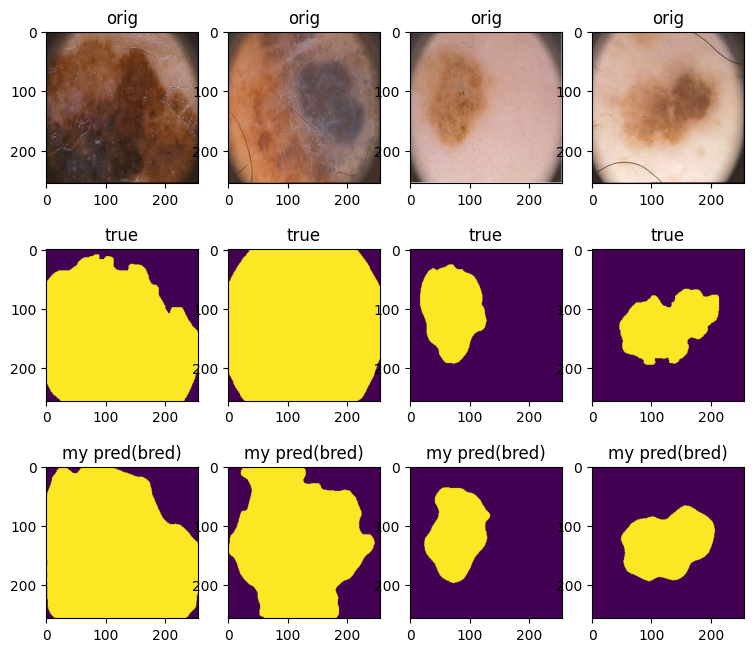

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 31 / 70
train iou: 0.8931653499603271. val iou: 0.8364320993423462
train loss: 0.08649656176567078. val loss: 0.11394480988383293


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 32 / 70
train iou: 0.8914331793785095. val iou: 0.8393063545227051
train loss: 0.08817012794315815. val loss: 0.11186602339148521


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 33 / 70
train iou: 0.8967172503471375. val iou: 0.8415145874023438
train loss: 0.08164160512387753. val loss: 0.10851016640663147


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 34 / 70
train iou: 0.8735527992248535. val iou: 0.8352401256561279
train loss: 0.0955568253993988. val loss: 0.11144425347447395


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 35 / 70
train iou: 0.8954504728317261. val iou: 0.8341297507286072
train loss: 0.08259888179600239. val loss: 0.11460137739777565


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 36 / 70
train iou: 0.8852478861808777. val iou: 0.8457592725753784
train loss: 0.08913399279117584. val loss: 0.10462827980518341


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 37 / 70
train iou: 0.879167377948761. val iou: 0.8530175685882568
train loss: 0.09331369400024414. val loss: 0.1011597067117691


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 38 / 70
train iou: 0.900043785572052. val iou: 0.8530105352401733
train loss: 0.0809921845793724. val loss: 0.1016000546514988


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 39 / 70
train iou: 0.8919097185134888. val iou: 0.8553760051727295
train loss: 0.08602986671030521. val loss: 0.10020749643445015


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 40 / 70
train iou: 0.90138179063797. val iou: 0.8647801876068115
train loss: 0.0783780924975872. val loss: 0.09535185620188713


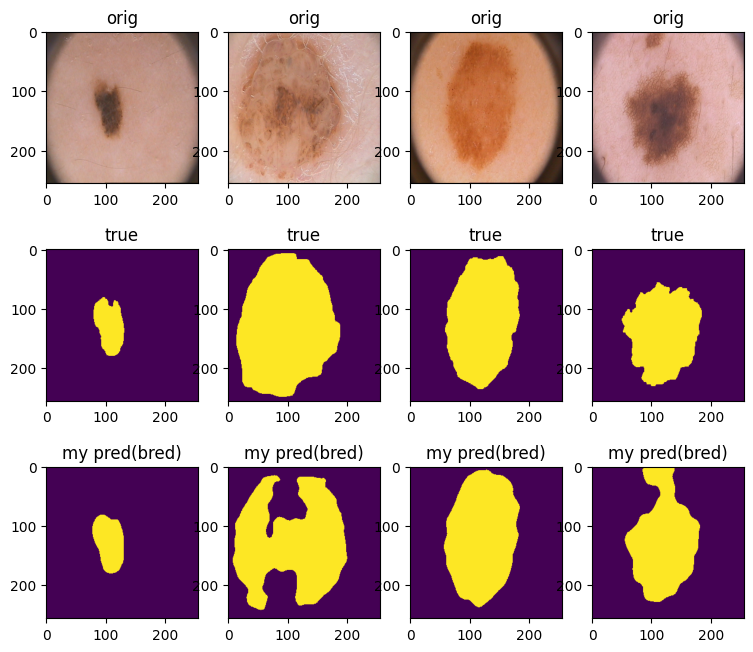

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 41 / 70
train iou: 0.903318464756012. val iou: 0.8653373718261719
train loss: 0.07755500078201294. val loss: 0.09304150566458702


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 42 / 70
train iou: 0.8875718116760254. val iou: 0.8699597120285034
train loss: 0.08601285517215729. val loss: 0.09308059886097908


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 43 / 70
train iou: 0.9083361029624939. val iou: 0.8595470190048218
train loss: 0.0730433501303196. val loss: 0.09762881696224213


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 44 / 70
train iou: 0.9075313806533813. val iou: 0.8611475825309753
train loss: 0.0741091538220644. val loss: 0.09680870920419693


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 45 / 70
train iou: 0.9015443921089172. val iou: 0.8616555333137512
train loss: 0.0788691695779562. val loss: 0.0950724184513092


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 46 / 70
train iou: 0.887623131275177. val iou: 0.8578169941902161
train loss: 0.08774888888001442. val loss: 0.09676380455493927


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 47 / 70
train iou: 0.9173328876495361. val iou: 0.8568375706672668
train loss: 0.0677662743255496. val loss: 0.0957772433757782


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 48 / 70
train iou: 0.9016441702842712. val iou: 0.8570033311843872
train loss: 0.07804644480347633. val loss: 0.09571181982755661


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 49 / 70
train iou: 0.8856088519096375. val iou: 0.85260009765625
train loss: 0.08593968115746975. val loss: 0.09814897924661636


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 50 / 70
train iou: 0.9135136008262634. val iou: 0.8507778644561768
train loss: 0.06936920154839754. val loss: 0.09937800094485283


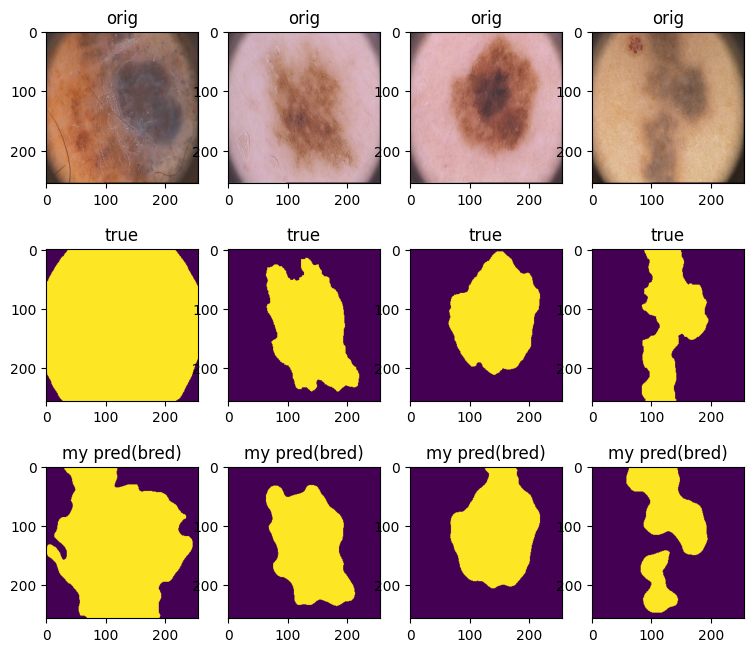

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 51 / 70
train iou: 0.9186482429504395. val iou: 0.8507570028305054
train loss: 0.06682121846824884. val loss: 0.0990617386996746


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 52 / 70
train iou: 0.9101852178573608. val iou: 0.8514261245727539
train loss: 0.0710980799049139. val loss: 0.09796225279569626


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 53 / 70
train iou: 0.9138715267181396. val iou: 0.8525170683860779
train loss: 0.07126033771783113. val loss: 0.09801997616887093


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 54 / 70
train iou: 0.9160791635513306. val iou: 0.8533596396446228
train loss: 0.06875423062592745. val loss: 0.09733843430876732


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 55 / 70
train iou: 0.9178531169891357. val iou: 0.8560973405838013
train loss: 0.0666939141228795. val loss: 0.09625846147537231


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 56 / 70
train iou: 0.919102668762207. val iou: 0.8564526438713074
train loss: 0.06722420454025269. val loss: 0.09524503722786903


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 57 / 70
train iou: 0.9202195405960083. val iou: 0.8577044010162354
train loss: 0.0664673550054431. val loss: 0.09457419067621231


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 58 / 70
train iou: 0.9144456386566162. val iou: 0.859092116355896
train loss: 0.07061234582215548. val loss: 0.09445684775710106


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 59 / 70
train iou: 0.9000494480133057. val iou: 0.8581236600875854
train loss: 0.07932985760271549. val loss: 0.09389432892203331


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 60 / 70
train iou: 0.8981630802154541. val iou: 0.8593654632568359
train loss: 0.08066152408719063. val loss: 0.09338383004069328


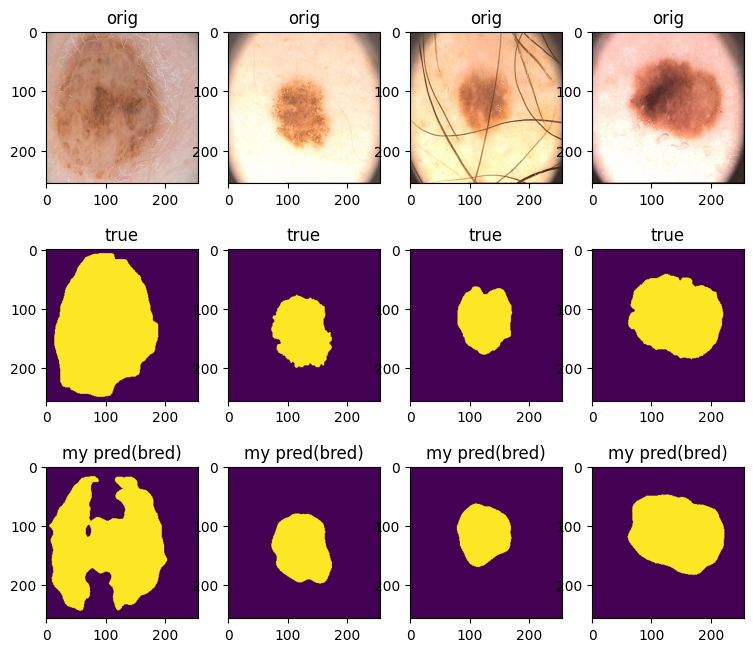

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 61 / 70
train iou: 0.9023146629333496. val iou: 0.8595938682556152
train loss: 0.07849069125950336. val loss: 0.09402420371770859


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 62 / 70
train iou: 0.9169071316719055. val iou: 0.8638424277305603
train loss: 0.06611489038914442. val loss: 0.09369542077183723


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 63 / 70
train iou: 0.903577446937561. val iou: 0.8622389435768127
train loss: 0.07684401050209999. val loss: 0.09360559284687042


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 64 / 70
train iou: 0.9207503795623779. val iou: 0.8603271842002869
train loss: 0.0659097321331501. val loss: 0.09380504861474037


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 65 / 70
train iou: 0.9187318682670593. val iou: 0.858237624168396
train loss: 0.06642312370240688. val loss: 0.09382836148142815


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 66 / 70
train iou: 0.9181414842605591. val iou: 0.8577014207839966
train loss: 0.06674727145582438. val loss: 0.09409854933619499


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 67 / 70
train iou: 0.9045994877815247. val iou: 0.8573048114776611
train loss: 0.07312574051320553. val loss: 0.09405999258160591


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 68 / 70
train iou: 0.9154481291770935. val iou: 0.8610019087791443
train loss: 0.06926799099892378. val loss: 0.09440279752016068


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 69 / 70
train iou: 0.9218236804008484. val iou: 0.8584378957748413
train loss: 0.06477370485663414. val loss: 0.09392551705241203


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 70 / 70
train iou: 0.9239333271980286. val iou: 0.8566532135009766
train loss: 0.06310178339481354. val loss: 0.09409652650356293


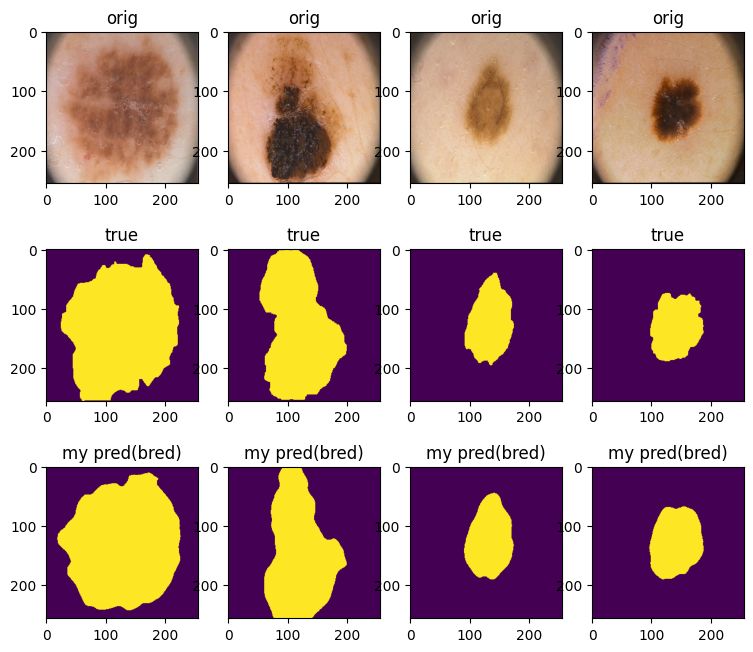

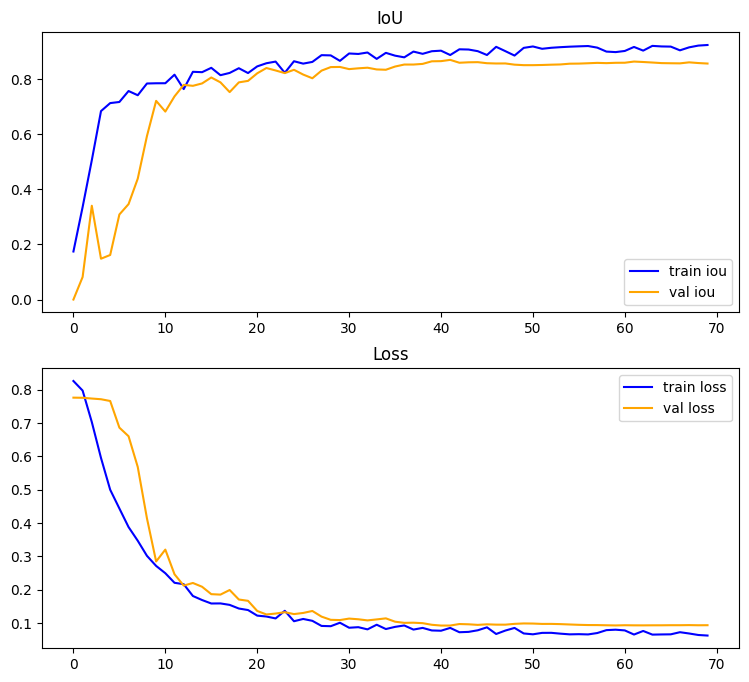

In [81]:
segnet_model_boundary = SegNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=segnet_model_boundary.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

cache = {}
criterion_boundary = lambda y_pred, y_real: dice_boundary_loss(y_pred, y_real, alpha=1.0, cache=cache)

train(segnet_model_boundary, loaders, 70, criterion_boundary, adamw, scheduler, device, plot=True)

Инференс трёх моделей

In [104]:
dice_metric = test(segnet_model_dice, test_dataloader, device)
focal_metric = test(segnet_model_focal, test_dataloader, device)
boundary_metric = test(segnet_model_boundary, test_dataloader, device)
dice_metric, focal_metric, boundary_metric

(0.8221172094345093, 0.7956550717353821, 0.8098294734954834)

dice loss: `0.8221172094345093`

focal loss: `0.7956550717353821`

boundary loss: `0.8098294734954834`

# Новая модель!

## U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

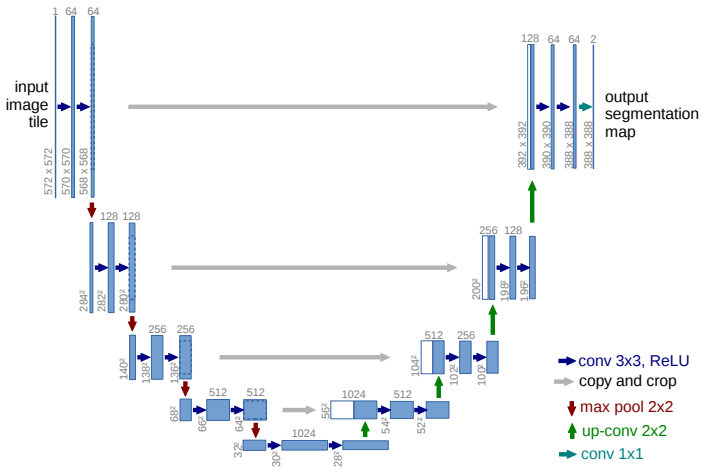

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [50]:
import torch.nn.functional as F
import torch.nn as nn

In [51]:
def _center_crop_to(t, h, w):
    _, _, H, W = t.shape
    dh, dw = (H - h) // 2, (W - w) // 2
    return t[:, :, dh:dh+h, dw:dw+w]

In [52]:
class UNetEncoderBlock(nn.Module):
  def __init__(self, in_c, out_c, depth=2, kernel_size=3, padding=1) -> None:
    super().__init__()
    self.layers = nn.ModuleList()
    for i in range(depth):
      conv_relu = ConvReLU(in_c if i == 0 else out_c, out_c, kernel_size, padding)
      self.layers.append(conv_relu)
    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

  def forward(self, x):
    for layer in self.layers:
      x = layer(x)
    last = x
    x = self.pool(x)
    return x, last
  
class UNetDecoderBlock(nn.Module):
  def __init__(self, in_c, skip_c, out_c, depth=2, kernel_size=3, padding=1, classification=False) -> None:
    super().__init__()
    self.upconv = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
    self.layers = nn.ModuleList()
    for i in range(depth):
      if depth == 1:
        if classification:
          self.layers.append(nn.Conv2d(in_c + skip_c, out_c, kernel_size, padding))
        else:
          self.layers.append(ConvReLU(in_c + skip_c, out_c, kernel_size, padding))
      elif i == depth - 1:
        if classification:
          self.layers.append(nn.Conv2d(in_c, out_c, kernel_size=kernel_size, padding=padding))
        else:
          self.layers.append(ConvReLU(in_c, out_c, kernel_size=kernel_size, padding=padding))
      elif i == 0:
        self.layers.append(ConvReLU(in_c + skip_c, in_c, kernel_size=kernel_size, padding=padding))
      else:
        self.layers.append(ConvReLU(in_c, in_c, kernel_size=kernel_size, padding=padding))

  def forward(self, x, last):
    x = self.upconv(x)
    
    if x.shape[2:] != last.shape[2:]:
      last = _center_crop_to(last, x.shape[2], x.shape[3])
    
    x = torch.cat([last, x], dim=1) # concat for C dim
    for layer in self.layers:
      x = layer(x)
    return x

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=64):
        super().__init__()

        self.enc1 = UNetEncoderBlock(in_channels, features, depth=2)
        self.enc2 = UNetEncoderBlock(features, features*2, depth=2)
        self.enc3 = UNetEncoderBlock(features*2, features*4, depth=3)
        self.enc4 = UNetEncoderBlock(features*4, features*8, depth=3)
        
        self.bn1 = ConvReLU(features*8, features*8, kernel_size=3, padding=1)
        self.bn2 = ConvReLU(features*8, features*8, kernel_size=3, padding=1)
        
        self.dec1 = UNetDecoderBlock(features*8, features*8, features*4, depth=3)
        self.dec2 = UNetDecoderBlock(features*4, features*4, features*2, depth=3)
        self.dec3 = UNetDecoderBlock(features*2, features*2, features, depth=2)
        self.dec4 = UNetDecoderBlock(features, features, out_channels, depth=2, classification=True) # no relu

    def forward(self, x):

      en1, last1 = self.enc1(x)
      en2, last2 = self.enc2(en1)
      en3, last3 = self.enc3(en2)
      en4, last4 = self.enc4(en3)
      
      bn1 = self.bn1(en4)
      bn2 = self.bn2(bn1)
      
      de1 = self.dec1(bn2, last4)
      de2 = self.dec2(de1, last3)
      de3 = self.dec3(de2, last2)
      de4 = self.dec4(de3, last1) # classification
      
      return de4

## Обучите UNet

Задание: обучите UNet на всех трех лоссах: BCE, Dice, Focal и сравните результаты с SegNet:
*   Какая модель дает лучшие значения по метрике?
*   Какая модель дает лучшие значения по лоссам?
*   Какая модель обучается быстрее?
*   Сравните визуально результаты SegNet и UNet.

Напишите развернутый ответ на вопросы.



  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 30
train iou: 0.5509122610092163. val iou: 0.0
train loss: 0.47246103733778. val loss: 0.6721494495868683


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 30
train iou: 0.7063784003257751. val iou: 0.0
train loss: 0.31408385932445526. val loss: 0.6264232993125916


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 30
train iou: 0.7522040605545044. val iou: 0.0
train loss: 0.2594500370323658. val loss: 0.5890709757804871


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 30
train iou: 0.7260041236877441. val iou: 0.0
train loss: 0.2557445429265499. val loss: 0.6360360980033875


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 30
train iou: 0.7543092966079712. val iou: 0.0
train loss: 0.22811085730791092. val loss: 0.7334780097007751


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 30
train iou: 0.7711995840072632. val iou: 0.07263825088739395
train loss: 0.20892143994569778. val loss: 0.7552018463611603


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 30
train iou: 0.8004721403121948. val iou: 0.27259957790374756
train loss: 0.1894020102918148. val loss: 0.5920932590961456


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 30
train iou: 0.7973625659942627. val iou: 0.3424220681190491
train loss: 0.18915679678320885. val loss: 0.6045408397912979


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 30
train iou: 0.8204886317253113. val iou: 0.43545961380004883
train loss: 0.16949040815234184. val loss: 0.48029495775699615


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 30
train iou: 0.8454293012619019. val iou: 0.6359012126922607
train loss: 0.1492350846529007. val loss: 0.3120235949754715


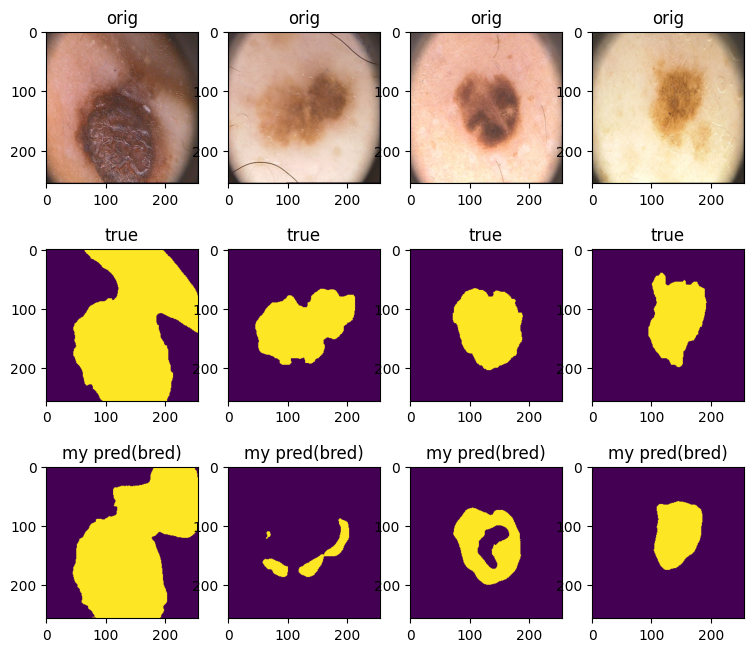

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 30
train iou: 0.7608931064605713. val iou: 0.7820254564285278
train loss: 0.19852102920413017. val loss: 0.21364986151456833


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 30
train iou: 0.7987215518951416. val iou: 0.7375618815422058
train loss: 0.1704825684428215. val loss: 0.22714229673147202


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 30
train iou: 0.7962355613708496. val iou: 0.8070583343505859
train loss: 0.18006423860788345. val loss: 0.17676114290952682


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 30
train iou: 0.8332926034927368. val iou: 0.8369438648223877
train loss: 0.15239689499139786. val loss: 0.16412421315908432


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 30
train iou: 0.8292598128318787. val iou: 0.8371001482009888
train loss: 0.15551475062966347. val loss: 0.17750950902700424


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 30
train iou: 0.8325772285461426. val iou: 0.839423418045044
train loss: 0.14895429834723473. val loss: 0.16381046921014786


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 30
train iou: 0.8576842546463013. val iou: 0.8643714189529419
train loss: 0.1282351389527321. val loss: 0.13845424354076385


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 30
train iou: 0.8645595908164978. val iou: 0.8577215075492859
train loss: 0.12010139413177967. val loss: 0.1376582533121109


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 30
train iou: 0.8785607814788818. val iou: 0.8557543158531189
train loss: 0.11110375262796879. val loss: 0.14070973172783852


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 30
train iou: 0.8749542832374573. val iou: 0.8441258668899536
train loss: 0.11249351315200329. val loss: 0.1544029451906681


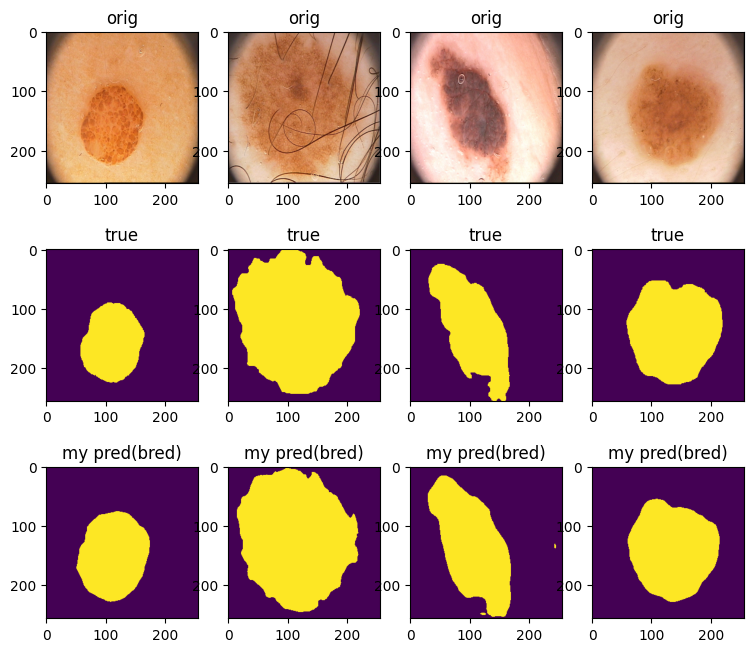

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 30
train iou: 0.8308669924736023. val iou: 0.8287233710289001
train loss: 0.1485942304134369. val loss: 0.17252812534570694


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 30
train iou: 0.8671573996543884. val iou: 0.8507986664772034
train loss: 0.12160985544323921. val loss: 0.1442219316959381


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 30
train iou: 0.8698102235794067. val iou: 0.8419694900512695
train loss: 0.1152426153421402. val loss: 0.15216521173715591


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 30
train iou: 0.8742603659629822. val iou: 0.8551472425460815
train loss: 0.11190314777195454. val loss: 0.1330103874206543


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 30
train iou: 0.8816086649894714. val iou: 0.8552102446556091
train loss: 0.10755784623324871. val loss: 0.13558028638362885


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 30
train iou: 0.8711140751838684. val iou: 0.8578132390975952
train loss: 0.11302172392606735. val loss: 0.13100972026586533


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 30
train iou: 0.9062292575836182. val iou: 0.8551774024963379
train loss: 0.08714361116290092. val loss: 0.1326211728155613


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 30
train iou: 0.902281641960144. val iou: 0.8477877974510193
train loss: 0.0890689566731453. val loss: 0.13729237765073776


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 30
train iou: 0.8952680230140686. val iou: 0.8465502262115479
train loss: 0.09281479194760323. val loss: 0.13978803902864456


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 30
train iou: 0.9153075814247131. val iou: 0.847162127494812
train loss: 0.08045023679733276. val loss: 0.14001107215881348


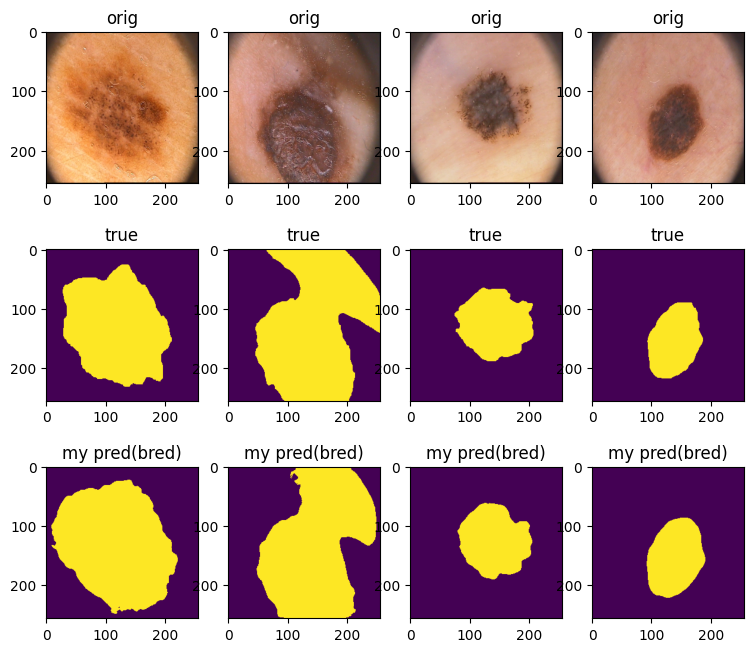

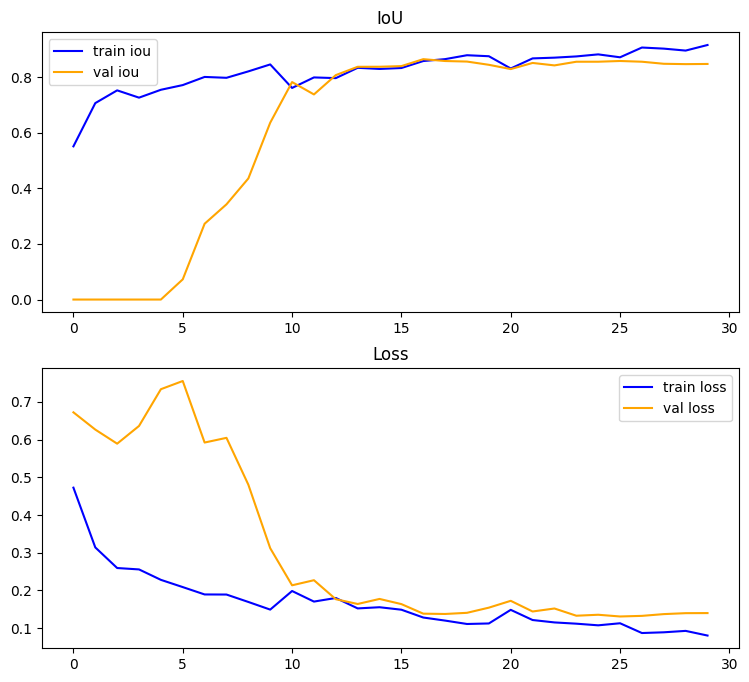

In [54]:
unet_model_bce = UNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=unet_model_bce.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

criterion_bce = nn.BCEWithLogitsLoss()

train(unet_model_bce, loaders, 30, criterion_bce, adamw, scheduler, device, plot=True)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 30
train iou: 0.48787811398506165. val iou: 0.0
train loss: 0.5309174582362175. val loss: 0.6467527449131012


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 30
train iou: 0.6066728234291077. val iou: 0.0
train loss: 0.4038580358028412. val loss: 0.6653501391410828


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 30
train iou: 0.702460527420044. val iou: 0.0
train loss: 0.35524868220090866. val loss: 0.6894743144512177


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 30
train iou: 0.6776494979858398. val iou: 0.01551842875778675
train loss: 0.3278452008962631. val loss: 0.767014741897583


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 30
train iou: 0.6994545459747314. val iou: 0.6486959457397461
train loss: 0.30058062076568604. val loss: 0.3722833842039108


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 30
train iou: 0.6757391691207886. val iou: 0.4696836471557617
train loss: 0.2780524641275406. val loss: 0.4544277489185333


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 30
train iou: 0.7254687547683716. val iou: 0.5943353176116943
train loss: 0.2511782869696617. val loss: 0.35509446263313293


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 30
train iou: 0.7697790861129761. val iou: 0.7469010353088379
train loss: 0.2252824455499649. val loss: 0.2354574352502823


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 30
train iou: 0.7092636227607727. val iou: 0.8041360378265381
train loss: 0.2233990654349327. val loss: 0.1911008581519127


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 30
train iou: 0.7773562073707581. val iou: 0.8244634866714478
train loss: 0.18922283872961998. val loss: 0.17287752032279968


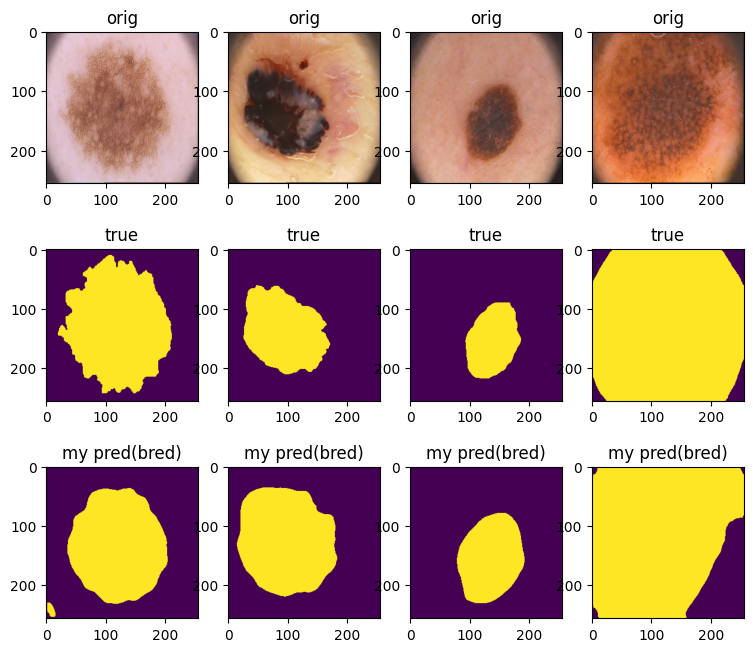

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 30
train iou: 0.7969011068344116. val iou: 0.8361080884933472
train loss: 0.1814245507121086. val loss: 0.16178938001394272


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 30
train iou: 0.8234074711799622. val iou: 0.8368352651596069
train loss: 0.15612077713012695. val loss: 0.14401062577962875


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 30
train iou: 0.8078087568283081. val iou: 0.8224025368690491
train loss: 0.15392528846859932. val loss: 0.1395675167441368


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 30
train iou: 0.7806758284568787. val iou: 0.7940258979797363
train loss: 0.16076911240816116. val loss: 0.14558320492506027


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 30
train iou: 0.7497878074645996. val iou: 0.6866934299468994
train loss: 0.1613902673125267. val loss: 0.25570186972618103


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 30
train iou: 0.7921526432037354. val iou: 0.7865859270095825
train loss: 0.14931150153279305. val loss: 0.16406960040330887


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 30
train iou: 0.8093159794807434. val iou: 0.7739582657814026
train loss: 0.1389158684760332. val loss: 0.17522871494293213


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 30
train iou: 0.8052530288696289. val iou: 0.8432270288467407
train loss: 0.13762164488434792. val loss: 0.12162713333964348


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 30
train iou: 0.8242250680923462. val iou: 0.8565370440483093
train loss: 0.12199241481721401. val loss: 0.10685744881629944


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 30
train iou: 0.8011919856071472. val iou: 0.846407949924469
train loss: 0.12845831364393234. val loss: 0.10381359979510307


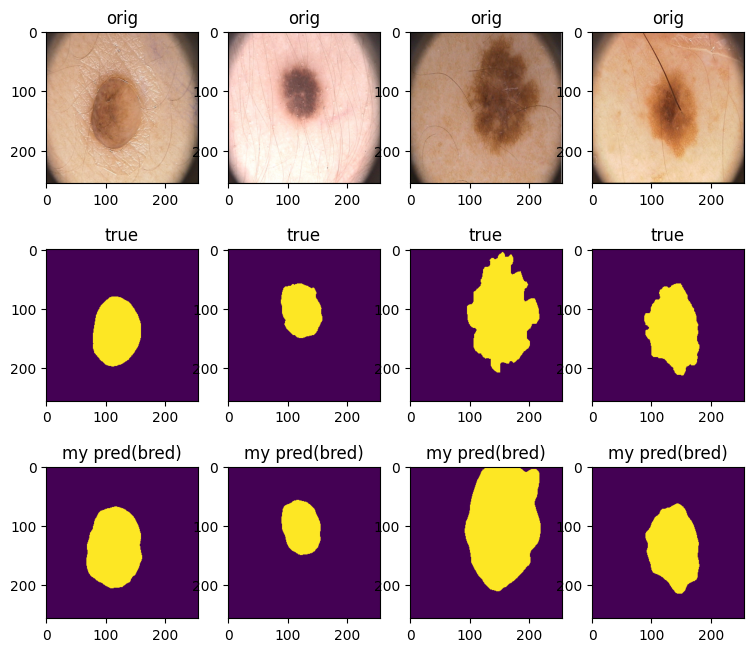

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 30
train iou: 0.8134843111038208. val iou: 0.8417925834655762
train loss: 0.12135090678930283. val loss: 0.10927721112966537


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 30
train iou: 0.8271939158439636. val iou: 0.8375735282897949
train loss: 0.11055102571845055. val loss: 0.11332722380757332


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 30
train iou: 0.851936399936676. val iou: 0.8395730257034302
train loss: 0.10629287734627724. val loss: 0.1108323261141777


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 30
train iou: 0.8553893566131592. val iou: 0.8478220701217651
train loss: 0.10646192915737629. val loss: 0.10362760722637177


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 30
train iou: 0.8597947955131531. val iou: 0.851960301399231
train loss: 0.10091808997094631. val loss: 0.10140922293066978


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 30
train iou: 0.8516660928726196. val iou: 0.8593127727508545
train loss: 0.10244196653366089. val loss: 0.09584316611289978


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 30
train iou: 0.8715605139732361. val iou: 0.8660165071487427
train loss: 0.0915317814797163. val loss: 0.08979939669370651


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 30
train iou: 0.8855057954788208. val iou: 0.8674764037132263
train loss: 0.08752590045332909. val loss: 0.08979309722781181


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 30
train iou: 0.8649568557739258. val iou: 0.857459306716919
train loss: 0.09538411721587181. val loss: 0.09696881473064423


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 30
train iou: 0.8849062919616699. val iou: 0.8525614738464355
train loss: 0.08442563191056252. val loss: 0.09795039519667625


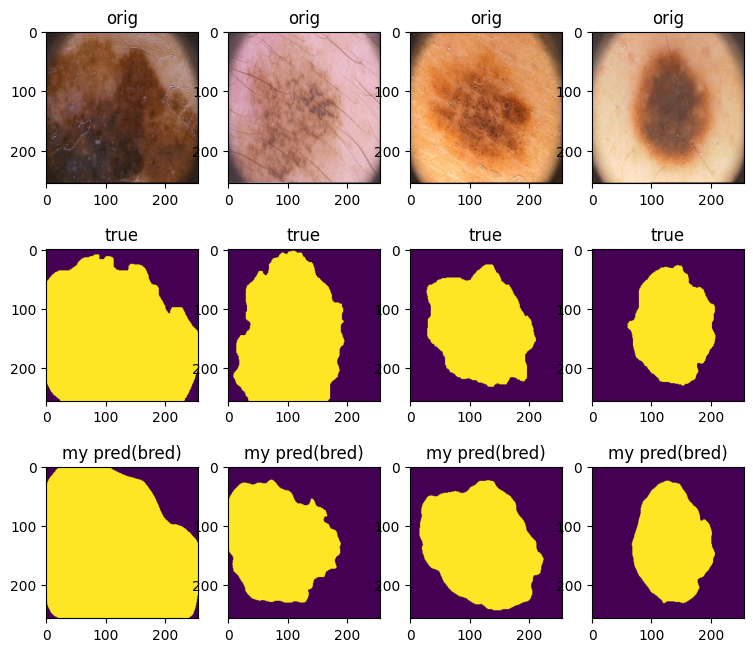

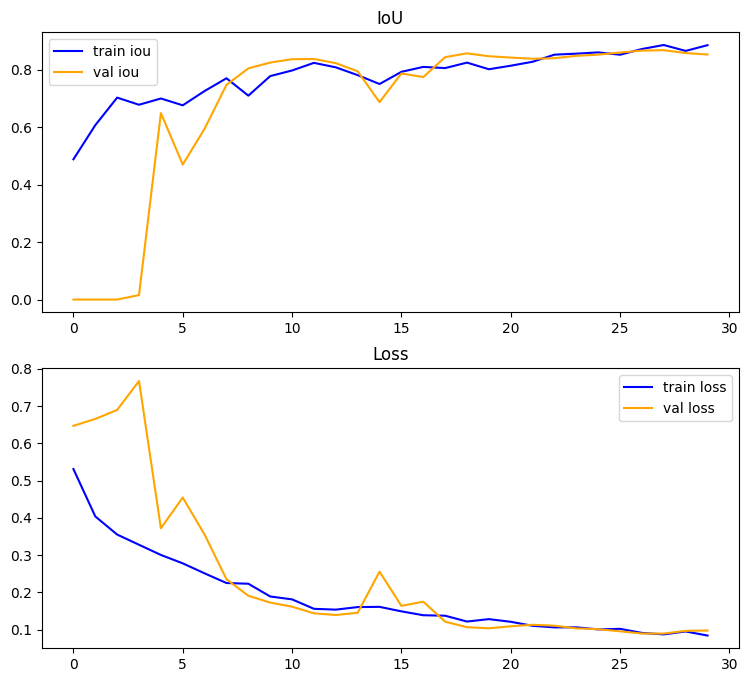

In [58]:
unet_model_dice = UNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=unet_model_dice.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

criterion_dice = lambda y_pred, y_real: dice_loss(y_pred, y_real)

train(unet_model_dice, loaders, 30, criterion_dice, adamw, scheduler, device, plot=True)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 30
train iou: 0.5427340269088745. val iou: 0.0
train loss: 0.11163302138447762. val loss: 0.15765439718961716


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 30
train iou: 0.6484382152557373. val iou: 0.0
train loss: 0.07313141971826553. val loss: 0.1496647372841835


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 30
train iou: 0.720041036605835. val iou: 0.0
train loss: 0.05910106189548969. val loss: 0.15466873347759247


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 30
train iou: 0.7703965902328491. val iou: 0.0
train loss: 0.04978255461901426. val loss: 0.17491158097982407


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 30
train iou: 0.7821139693260193. val iou: 0.0076232785359025
train loss: 0.04854580573737621. val loss: 0.15517424792051315


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 30
train iou: 0.753973126411438. val iou: 0.05202188342809677
train loss: 0.05246879905462265. val loss: 0.24346255511045456


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 30
train iou: 0.7755460143089294. val iou: 0.2250795066356659
train loss: 0.046751223504543304. val loss: 0.1698424220085144


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 30
train iou: 0.7778242826461792. val iou: 0.44015204906463623
train loss: 0.04966197069734335. val loss: 0.09923523291945457


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 30
train iou: 0.7806997895240784. val iou: 0.5642035007476807
train loss: 0.04670762084424496. val loss: 0.08237411826848984


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 30
train iou: 0.7932416200637817. val iou: 0.7521836757659912
train loss: 0.04323665611445904. val loss: 0.06444304063916206


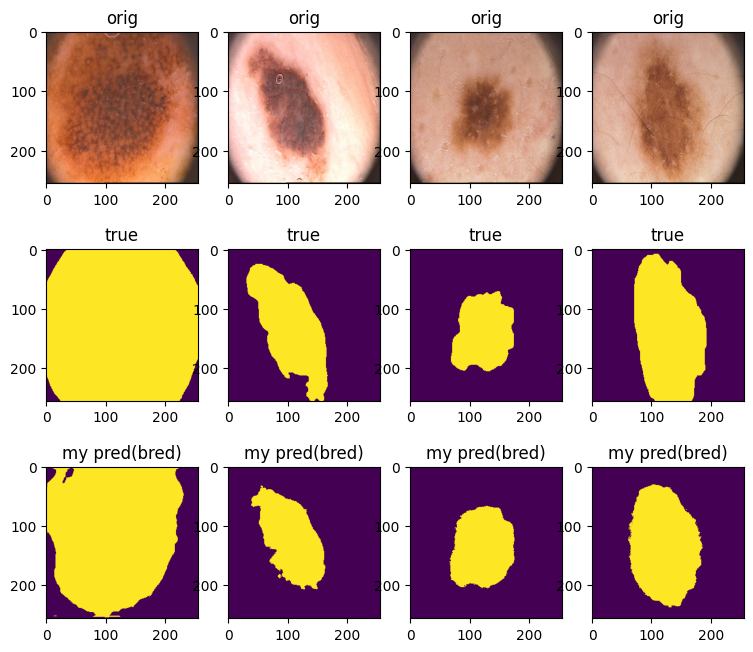

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 30
train iou: 0.8043103814125061. val iou: 0.6324115991592407
train loss: 0.04264784511178732. val loss: 0.09209784492850304


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 30
train iou: 0.7783033847808838. val iou: 0.7113549709320068
train loss: 0.045591278932988644. val loss: 0.06707500666379929


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 30
train iou: 0.8203496336936951. val iou: 0.7947447896003723
train loss: 0.040796710178256035. val loss: 0.04910929501056671


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 30
train iou: 0.8116944432258606. val iou: 0.794867992401123
train loss: 0.03982835076749325. val loss: 0.05028386227786541


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 30
train iou: 0.8051731586456299. val iou: 0.8353393077850342
train loss: 0.041129217483103275. val loss: 0.04236540012061596


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 30
train iou: 0.8149181008338928. val iou: 0.8295353651046753
train loss: 0.04172814730554819. val loss: 0.04041360877454281


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 30
train iou: 0.8220943212509155. val iou: 0.7895050048828125
train loss: 0.038031257688999176. val loss: 0.05055668018758297


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 30
train iou: 0.8355336785316467. val iou: 0.7820724248886108
train loss: 0.03631160268560052. val loss: 0.050279317423701286


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 30
train iou: 0.8455344438552856. val iou: 0.8053063154220581
train loss: 0.03393878974020481. val loss: 0.04569942690432072


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 30
train iou: 0.8419262170791626. val iou: 0.818636417388916
train loss: 0.03237058315426111. val loss: 0.04382914863526821


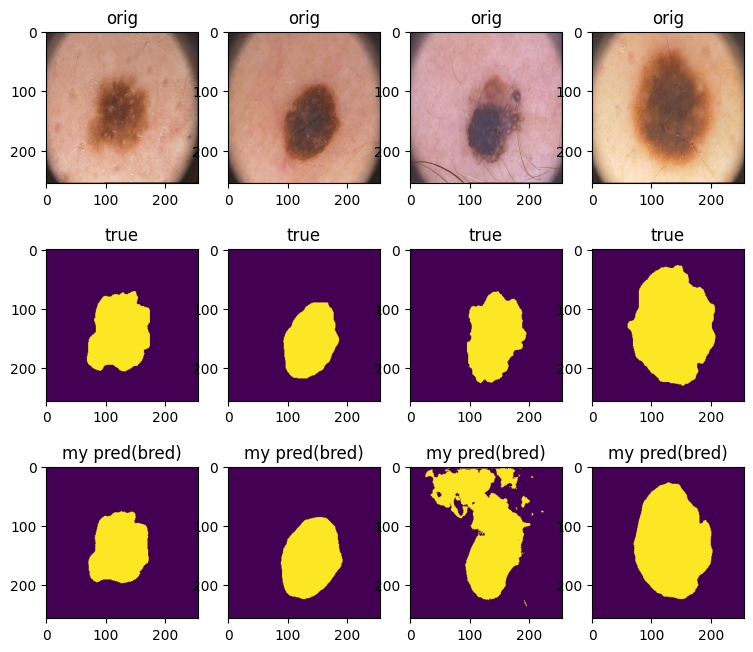

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 30
train iou: 0.8386458158493042. val iou: 0.8366426229476929
train loss: 0.03274921607226133. val loss: 0.03911629691720009


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 30
train iou: 0.7888956069946289. val iou: 0.8156330585479736
train loss: 0.044839940033853054. val loss: 0.04170520044863224


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 30
train iou: 0.855087399482727. val iou: 0.773789644241333
train loss: 0.03158710803836584. val loss: 0.05370720848441124


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 30
train iou: 0.8350343108177185. val iou: 0.8048028945922852
train loss: 0.034039896447211504. val loss: 0.04634242504835129


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 30
train iou: 0.8648978471755981. val iou: 0.8001002073287964
train loss: 0.0287774414755404. val loss: 0.0462084524333477


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 30
train iou: 0.8753178715705872. val iou: 0.8195757865905762
train loss: 0.026264246553182602. val loss: 0.04235807619988918


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 30
train iou: 0.8588151931762695. val iou: 0.8172614574432373
train loss: 0.029993759468197823. val loss: 0.040985606610774994


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 30
train iou: 0.8879272937774658. val iou: 0.8320492506027222
train loss: 0.02445622067898512. val loss: 0.038644181564450264


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 30
train iou: 0.8818202614784241. val iou: 0.8343343138694763
train loss: 0.024978310335427523. val loss: 0.037739185616374016


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 30
train iou: 0.8940668702125549. val iou: 0.8432124853134155
train loss: 0.022753968369215727. val loss: 0.03725308179855347


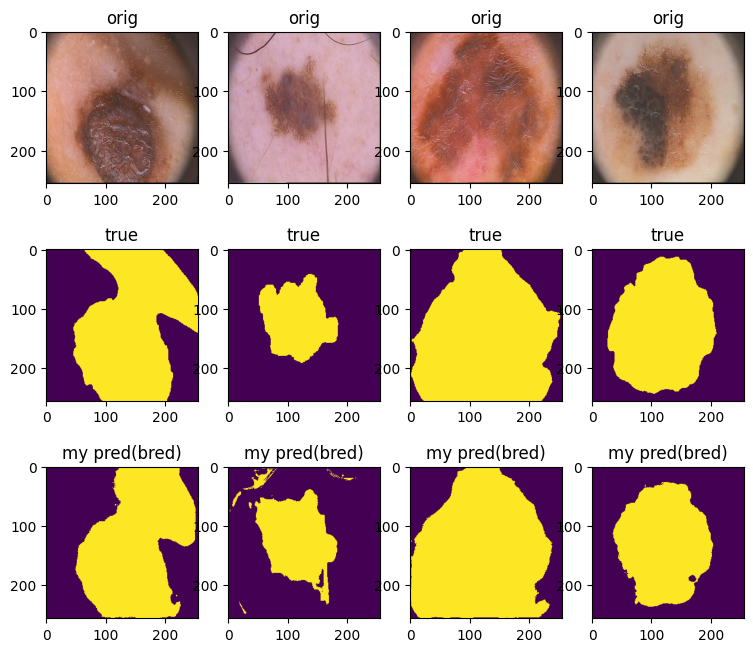

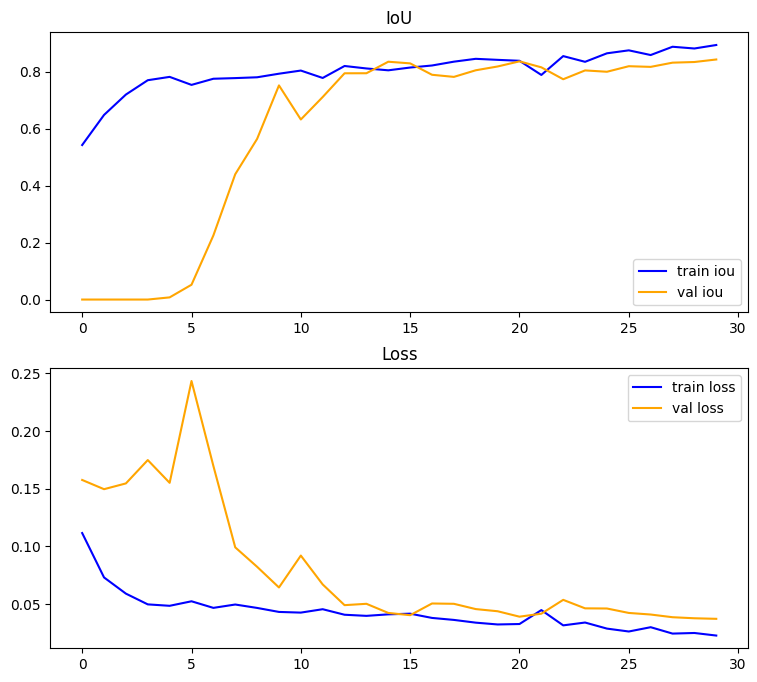

In [59]:
unet_model_focal = UNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=unet_model_focal.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

criterion_focal = lambda y_pred, y_real: focal_loss(y_pred, y_real, gamma=2.0)

train(unet_model_focal, loaders, 30, criterion_focal, adamw, scheduler, device, plot=True)

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1 / 30
train iou: 0.4968613386154175. val iou: 0.0012651028810068965
train loss: 0.6672245413064957. val loss: 0.8001895546913147


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 2 / 30
train iou: 0.6484938859939575. val iou: 0.0
train loss: 0.5113800913095474. val loss: 0.8046935796737671


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 3 / 30
train iou: 0.7044252753257751. val iou: 0.0
train loss: 0.4364723116159439. val loss: 0.7997634410858154


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 4 / 30
train iou: 0.6298050880432129. val iou: 0.09408983588218689
train loss: 0.4081645980477333. val loss: 0.7493220269680023


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 5 / 30
train iou: 0.7015879154205322. val iou: 0.33180519938468933
train loss: 0.34728023409843445. val loss: 0.613037645816803


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 6 / 30
train iou: 0.7450625896453857. val iou: 0.544299304485321
train loss: 0.3055430129170418. val loss: 0.4473007470369339


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 7 / 30
train iou: 0.7279805541038513. val iou: 0.7430721521377563
train loss: 0.29489003866910934. val loss: 0.2850310951471329


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 8 / 30
train iou: 0.7716381549835205. val iou: 0.7164154648780823
train loss: 0.2466493472456932. val loss: 0.2749069184064865


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 9 / 30
train iou: 0.751816987991333. val iou: 0.80601966381073
train loss: 0.2377699464559555. val loss: 0.1918027102947235


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 10 / 30
train iou: 0.7774432897567749. val iou: 0.8107788562774658
train loss: 0.20908856019377708. val loss: 0.17753265798091888


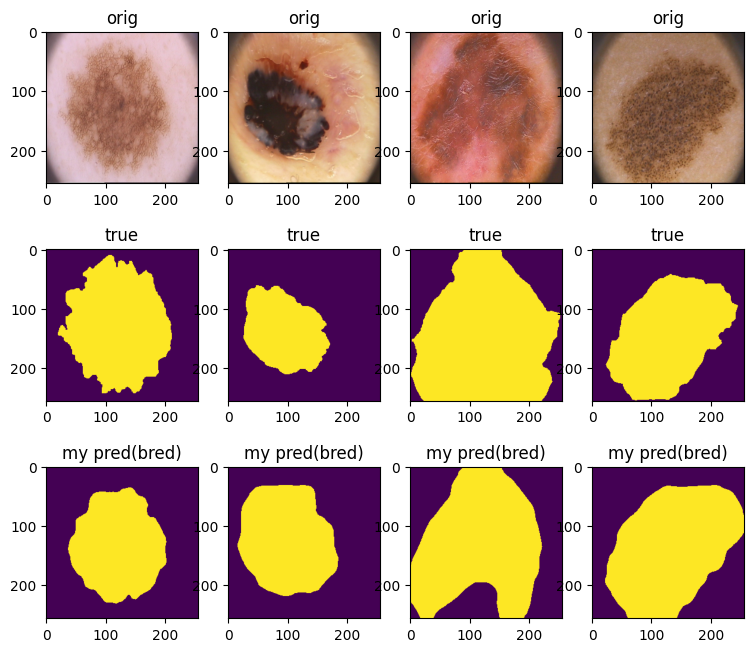

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 11 / 30
train iou: 0.7912977337837219. val iou: 0.8173755407333374
train loss: 0.1863384060561657. val loss: 0.16449853032827377


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 12 / 30
train iou: 0.7899394035339355. val iou: 0.8061051964759827
train loss: 0.18531275913119316. val loss: 0.1671518087387085


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 13 / 30
train iou: 0.805684506893158. val iou: 0.8098580837249756
train loss: 0.16750656813383102. val loss: 0.15557044744491577


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 14 / 30
train iou: 0.7929256558418274. val iou: 0.7829405069351196
train loss: 0.16685136407613754. val loss: 0.16918841004371643


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 15 / 30
train iou: 0.7904940247535706. val iou: 0.8010544776916504
train loss: 0.16691119968891144. val loss: 0.16775771975517273


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 16 / 30
train iou: 0.8260599970817566. val iou: 0.8309506177902222
train loss: 0.14212613180279732. val loss: 0.12833788618445396


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 17 / 30
train iou: 0.8436734080314636. val iou: 0.8293358087539673
train loss: 0.12611431814730167. val loss: 0.12327833846211433


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 18 / 30
train iou: 0.8108434081077576. val iou: 0.8368754386901855
train loss: 0.1379176750779152. val loss: 0.11546852812170982


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 19 / 30
train iou: 0.8303060531616211. val iou: 0.8341878652572632
train loss: 0.13791130855679512. val loss: 0.11664121970534325


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 20 / 30
train iou: 0.823885440826416. val iou: 0.8386310338973999
train loss: 0.13935651630163193. val loss: 0.11505437642335892


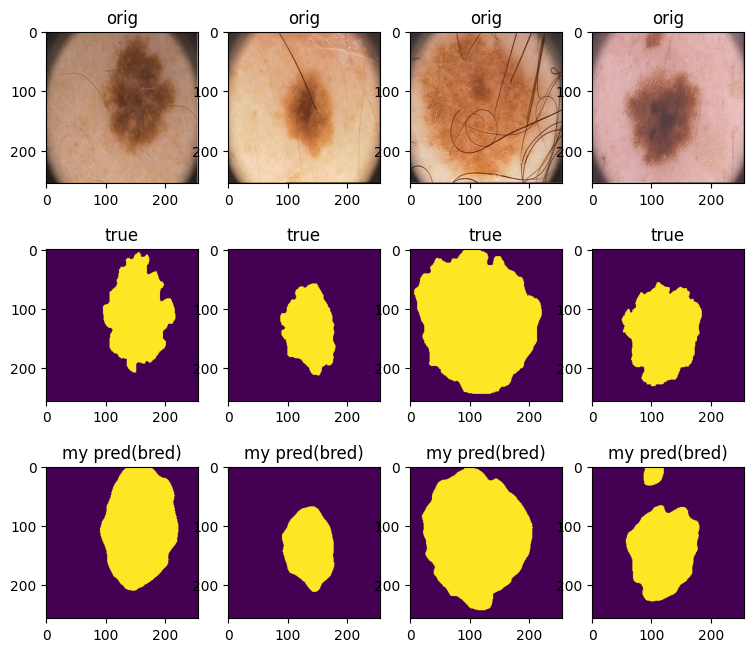

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 21 / 30
train iou: 0.8332096338272095. val iou: 0.8269708752632141
train loss: 0.1265719961374998. val loss: 0.11729248240590096


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 22 / 30
train iou: 0.8348384499549866. val iou: 0.834054708480835
train loss: 0.11999616213142872. val loss: 0.11180906370282173


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 23 / 30
train iou: 0.8575567603111267. val iou: 0.8374114036560059
train loss: 0.11027757078409195. val loss: 0.11038240045309067


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 24 / 30
train iou: 0.8570542931556702. val iou: 0.8401414155960083
train loss: 0.11285113357007504. val loss: 0.11009088531136513


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 25 / 30
train iou: 0.8394507765769958. val iou: 0.8490797281265259
train loss: 0.11586376652121544. val loss: 0.1004253700375557


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 26 / 30
train iou: 0.8409469127655029. val iou: 0.8553403615951538
train loss: 0.11624960787594318. val loss: 0.09888175129890442


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 27 / 30
train iou: 0.8676511645317078. val iou: 0.8455120325088501
train loss: 0.09736627712845802. val loss: 0.10641715303063393


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 28 / 30
train iou: 0.8698774576187134. val iou: 0.8416461944580078
train loss: 0.09630599617958069. val loss: 0.10679551213979721


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 29 / 30
train iou: 0.8781891465187073. val iou: 0.848260760307312
train loss: 0.0949444156140089. val loss: 0.101174496114254


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 30 / 30
train iou: 0.8447587490081787. val iou: 0.8291612267494202
train loss: 0.10790224745869637. val loss: 0.1211618185043335


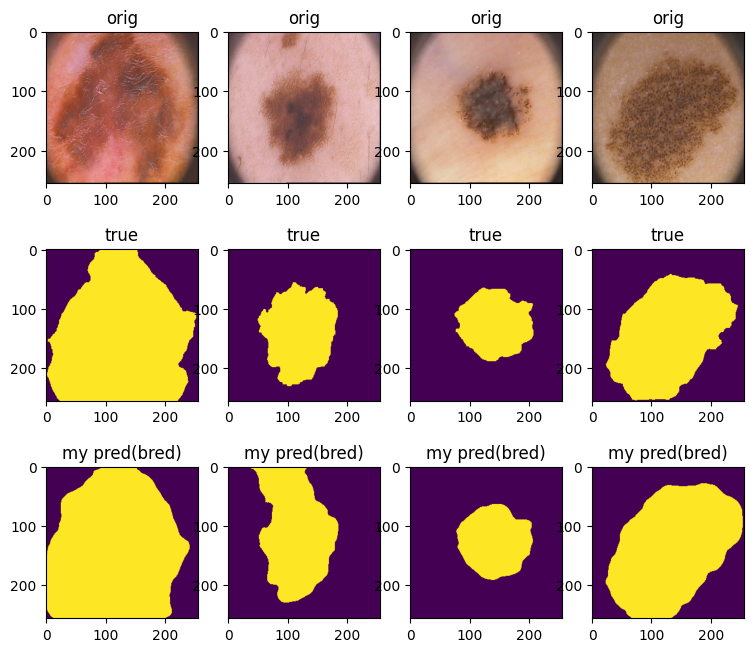

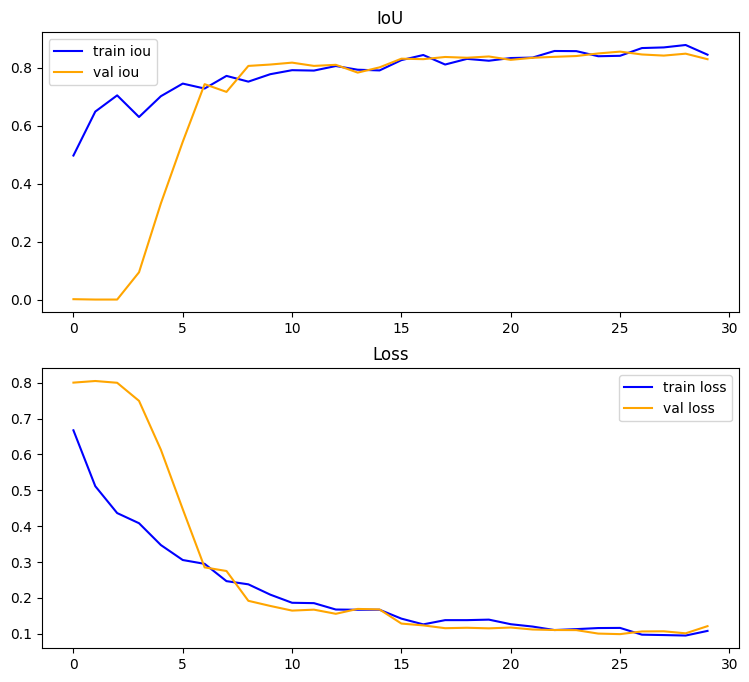

In [60]:
unet_model_boundary = UNet().to(device)

adamw = optim.AdamW(lr=3e-4, params=unet_model_boundary.parameters())
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(adamw, mode='max', patience=3, factor=0.5)

cache = {}
criterion_boundary = lambda y_pred, y_real: dice_boundary_loss(y_pred, y_real, alpha=1.0, cache=cache)

train(unet_model_boundary, loaders, 30, criterion_boundary, adamw, scheduler, device, plot=True)

In [62]:
best_metric = 0.0
best_model = None
best_loss = ""

losses = {
    "bce": unet_model_bce,
    "dice": unet_model_dice,
    "focal": unet_model_focal,
    "boundary": unet_model_boundary
}

for loss, unet_model in losses.items():
    print(f"Testing unet with {loss} loss")
    metric = test(unet_model, test_dataloader, device)
    print(f"Metric: {metric}\n")
    if metric > best_metric:
        best_metric = metric
        best_model = unet_model
        best_loss = loss


print(f"Best loss: {loss}\nMetric: {best_metric}")

Testing unet with bce loss
Metric: 0.8660834431648254

Testing unet with dice loss
Metric: 0.859534740447998

Testing unet with focal loss
Metric: 0.8474679589271545

Testing unet with boundary loss
Metric: 0.8462227582931519

Best loss: boundary
Metric: 0.8660834431648254


Best loss with UNet:  0.8660834431648254